In [1]:
import os.path
import numpy as np
import matplotlib.pyplot as plt
import scipy
import refnx #https://refnx.readthedocs.io/en/latest/installation.html
from refnx.dataset import ReflectDataset, Data1D
from refnx.analysis import Transform, CurveFitter, Objective, Model, Parameter
from refnx.reflect import SLD, Slab, ReflectModel
import time
import mpld3 #you may need to pip install mpld3 to get this working - it allows zoom action on inline plots
import seaborn as sns
#pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/XRay/XRR/'
path = os.getcwd()
print(path)
pth = '../Data/'
img_pth = '../Outputs/'
%load_ext autoreload
%autoreload 2
import matplotlib as mpl
%matplotlib widget
import glob 
import ana_xrr
colors = ['#4053d3', '#b51d14', '#ddb310','#348f42','#7e1e9c', '#75bbfd', '#cacaca']
sns.set_palette(colors)

def grab_ind(obj_list, ind): 
    return [o[ind] for o in obj_list]

/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code


# Conversions

 $ q = 4 \pi \sin \theta / \lambda$

 The oscillations go as $ \cos (4 \pi d / \sqrt{\sin^2 \theta - 2 \delta})$ where $d$ is the layer thickness, so 

 $ \sin \theta = q \lambda/ 4 \pi$

 $ \cos (4 \pi d / \lambda \sqrt{(q \lambda / 4 \pi)^2 - 2 \delta})$

## Load data

In [2]:
flist_lv = glob.glob('lv*.txt', root_dir=pth)
flist_lv.sort()
print(flist_lv)

labs_lv = ['67 nm Al', '30 nm Al/AlOx/37 nm Al', 'Slow 50 nm Al/5x AlOx/20 nm Al', 'Fast 50 nm Al/5x AlOx/20 nm Al','80 nm Ta/8 nm Al/AlOx/50 nm Al','80 nm Ta/8 nm Al/AlOx/50 nm Al','80 nm Ta/8 nm Al/AlOx/50 nm Al redo','80 nm Ta/AlOx/150 nm Ta']
flist_stan = glob.glob('su*.txt', root_dir=pth)
flist_stan.sort()
print(flist_stan)
labs_stan = ['80 Nb/8 Al/AlOx/50 Al 9 T Static','80 Nb/8 Al/AlOx/50 Al 9 T Static Redo','80 Nb/8 Al/AlOx/3 Al/80 nm Nb 9 T Static','80 Nb/8 Al/AlOx/50 Al 1 T Static','80 Nb/8 Al/AlOx/50 Al 6 T Dynamic']

flist = flist_lv + flist_stan
labs = labs_lv + labs_stan

['lv1_XRR_1_scan1.txt', 'lv2_XRR_1_scan1.txt', 'lv3_XRR_1_scan1.txt', 'lv4_XRR_1_scan1.txt', 'lv5_XRR_1_scan1.txt', 'lv6_XRR_1_redo_scan1.txt', 'lv6_XRR_1_scan1.txt', 'lv7_XRR_1_scan1.txt']
['su01_XRR_1_remeas_scan1.txt', 'su01_XRR_3_scan1.txt', 'su02_XRR_1_scan1.txt', 'su03_XRR_1_scan1.txt', 'su04_XRR_1_scan1.txt', 'su05_XRR_1_scan1.txt', 'su06_XRR_1_scan1.txt', 'su07_XRR_1_scan1.txt', 'su08_XRR_1_scan1.txt']


# Al devices

## Compare fit ranges

1.3498101268122702: : 254it [00:43,  5.84it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:371: UserWarning: The figure layout has changed to tight
  


Layer Properties:
  Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
 alox_0       8.030519       1.442659          25.095775
   al_1     476.407441       0.055019          18.069068
 buff_2      15.172346       9.235887           9.353336
al2o3_3            inf      12.986813          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 2.6994001168954296
Log10 Background               -9.0
 DQ - Resolution           1.983825
        Q Offset          -0.001667
           Scale           0.882829


0.486464272821926: : 338it [00:46,  7.35it/s]  
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:371: UserWarning: The figure layout has changed to tight
  


0.27021613094637137: : 259it [00:32,  8.06it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Layer Properties:
  Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
 alox_0      41.150303       4.385400          17.723192
   al_1     432.017161       7.789529          21.245499
 buff_2      27.267291       8.980293          17.021732
al2o3_3            inf      12.303766          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.5403473522469167
Log10 Background           -6.30103
 DQ - Resolution           2.310039
        Q Offset           0.000031
           Scale           1.492158


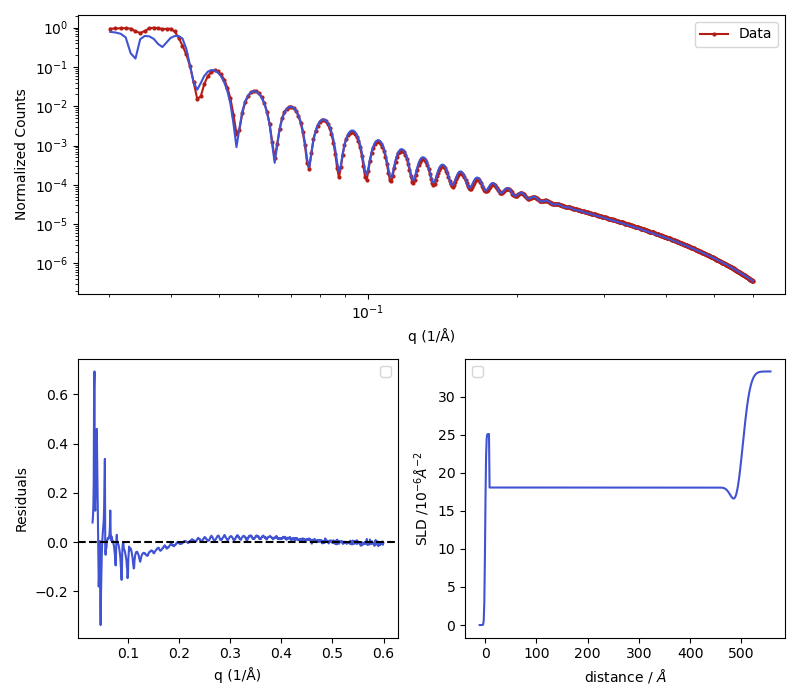

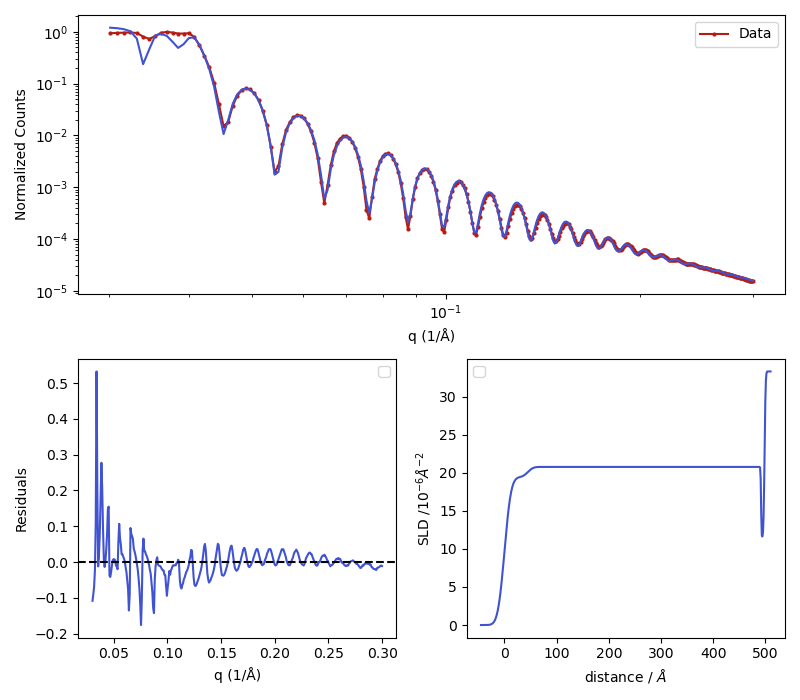

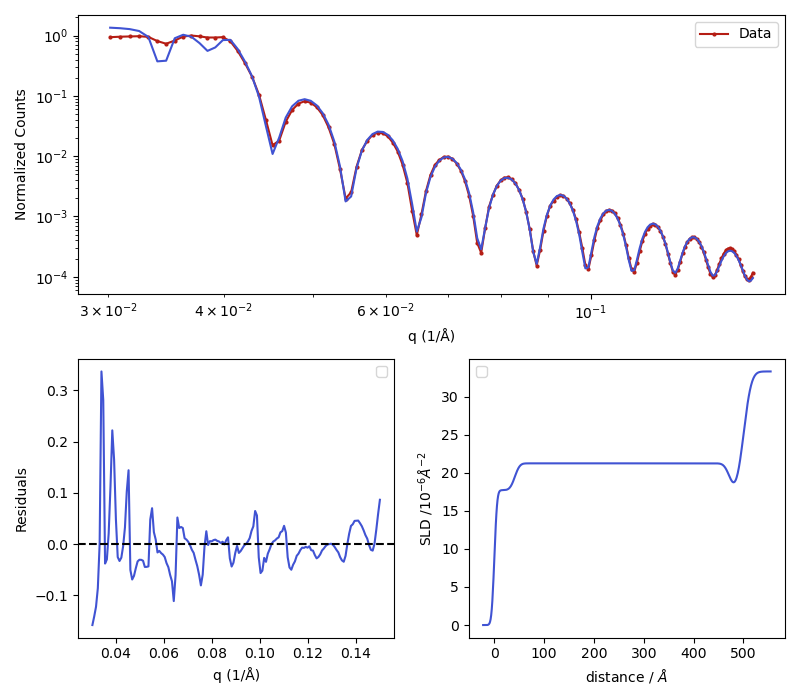

In [24]:
#par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'thk':[5, 450, 5, np.inf]}
outs =[]
outs.append(ana_xrr.sim(pth + flist[0], 'alox/al/buff/al2o3', par, [0.03, 0.6], img_path=img_pth))
ana_xrr.generate_table(outs[-1][1]) 

outs.append(ana_xrr.sim(pth + flist[0], 'alox/al/buff/al2o3', outs[-1][1], [0.03, 0.3], img_path=img_pth))

outs.append(ana_xrr.sim(pth + flist[0], 'alox/al/buff/al2o3', outs[-1][1], [0.03, 0.15], img_path=img_pth))
ana_xrr.generate_table(outs[-1][1])

## Compare model levels

1.4404945651785006: : 48it [00:04, 11.71it/s]


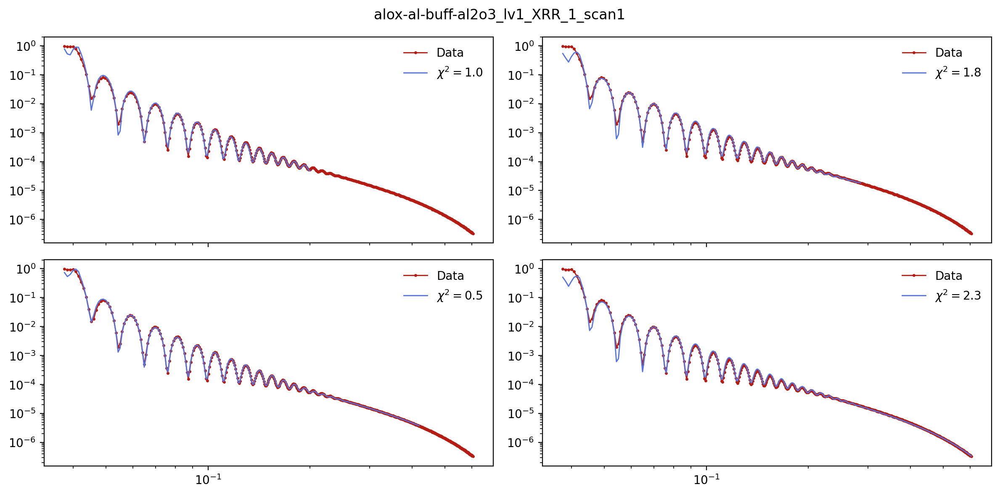

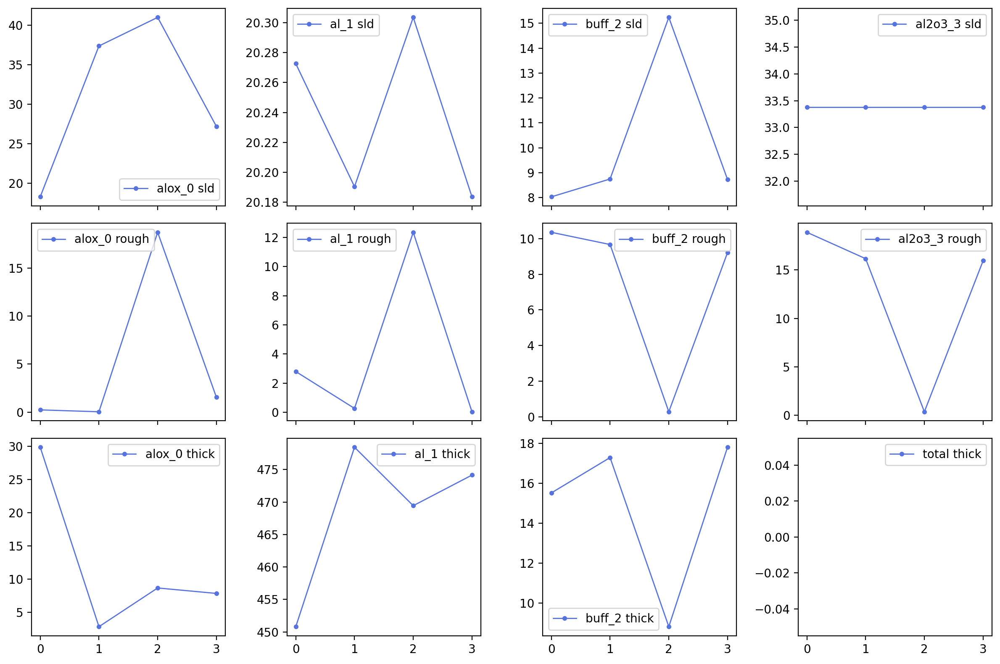

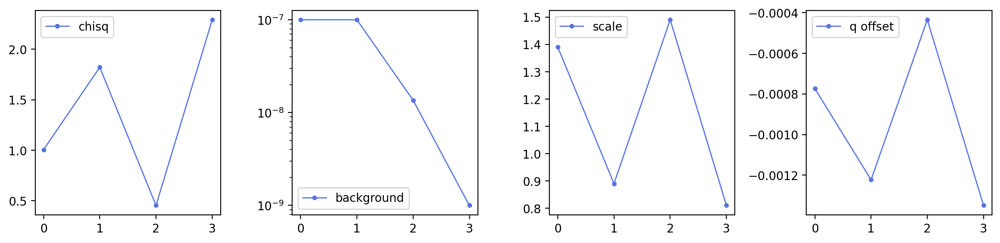

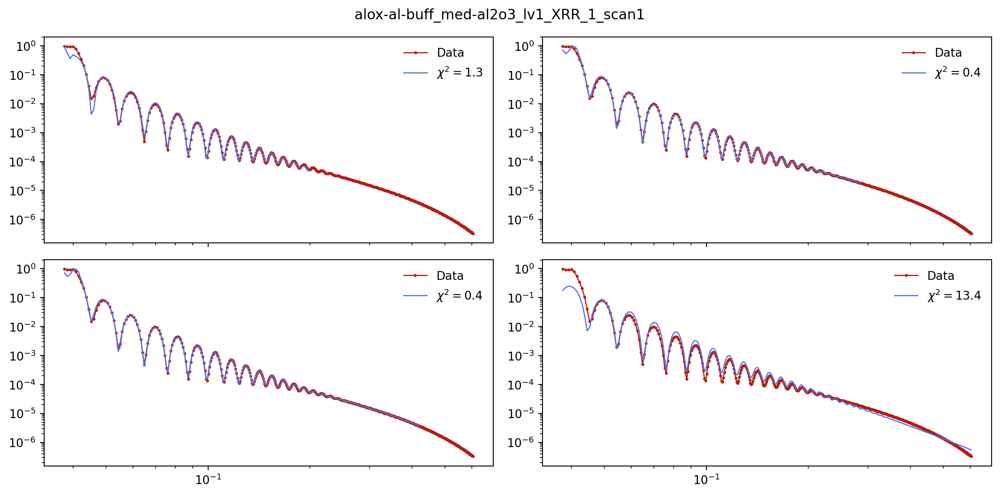

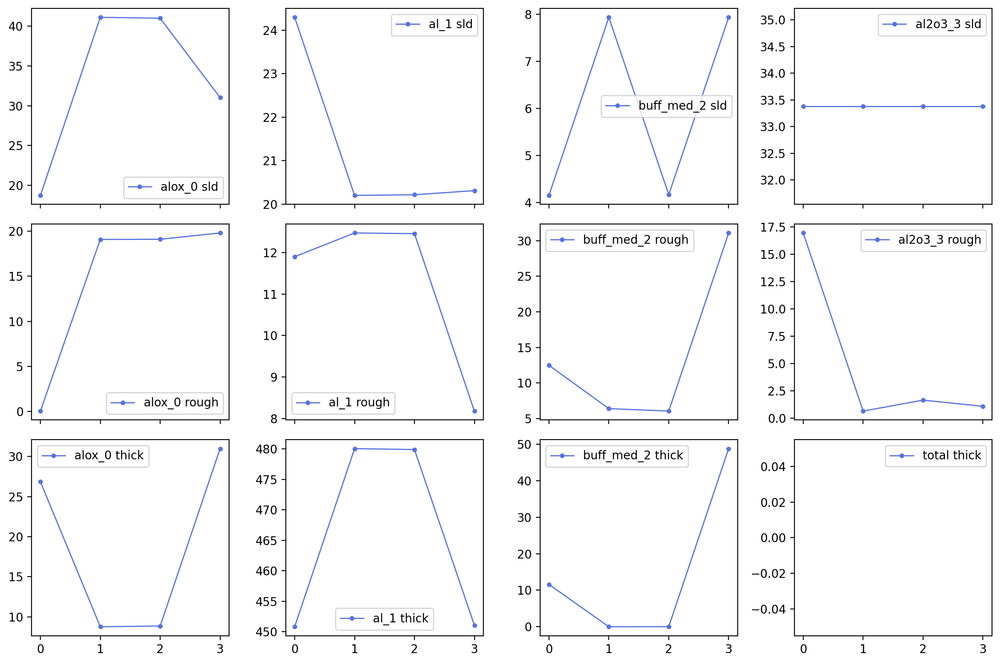

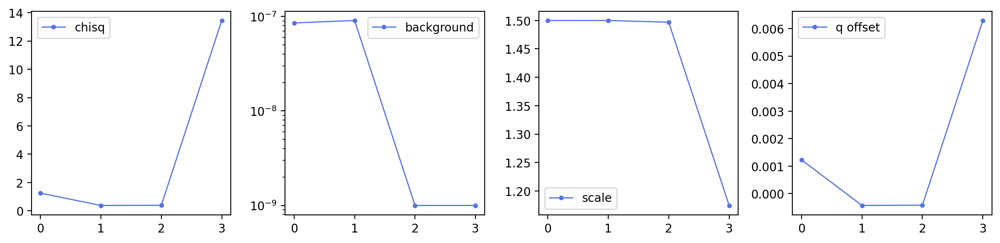

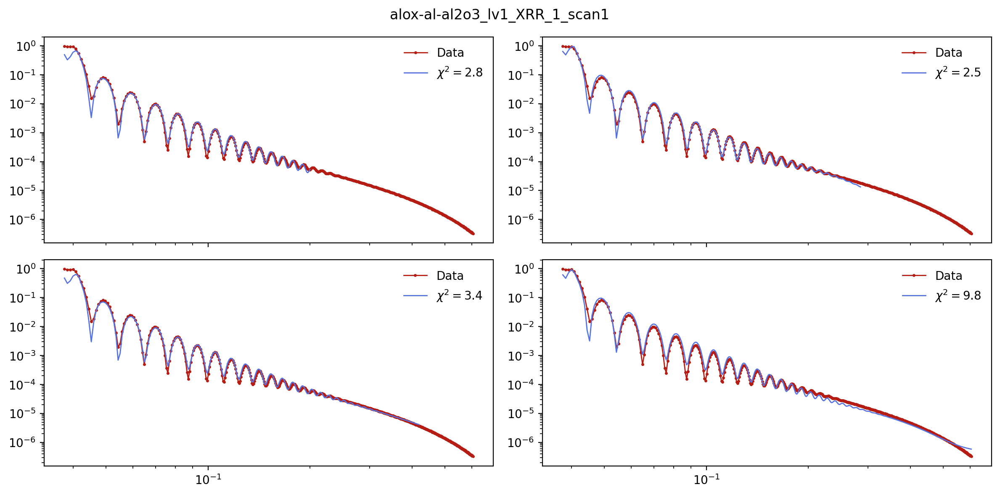

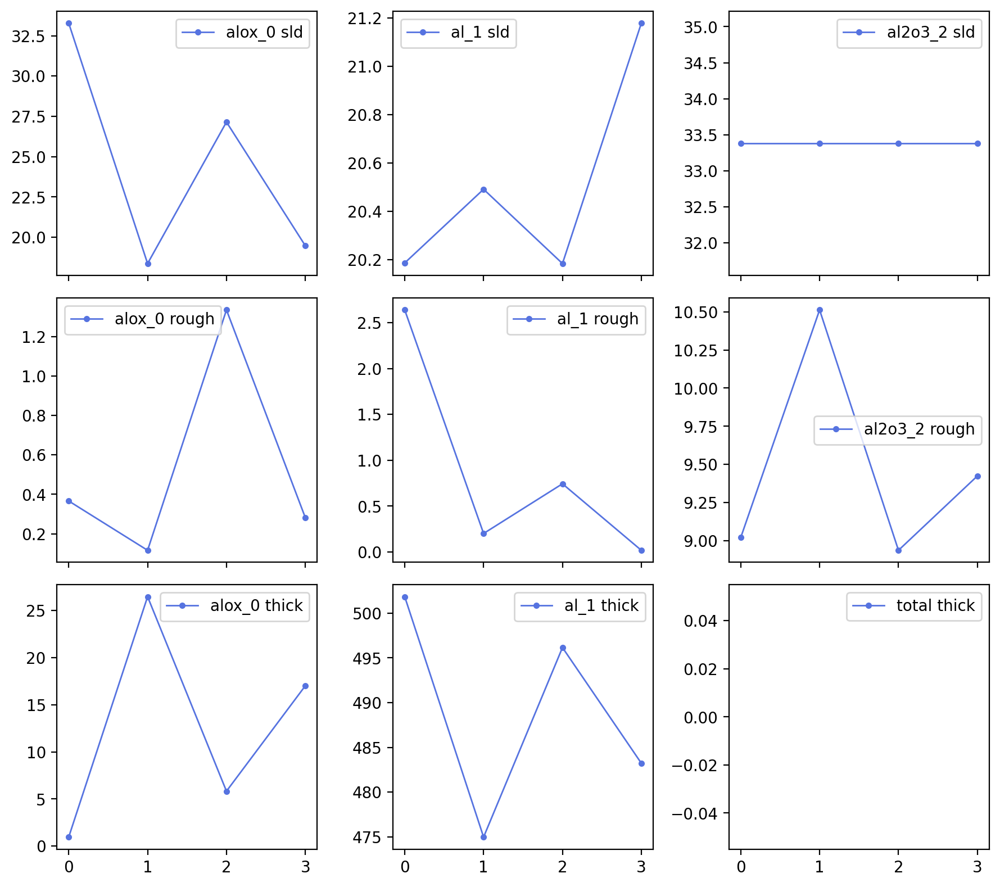

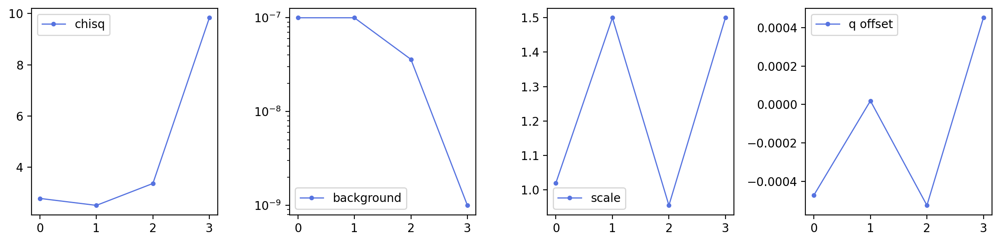

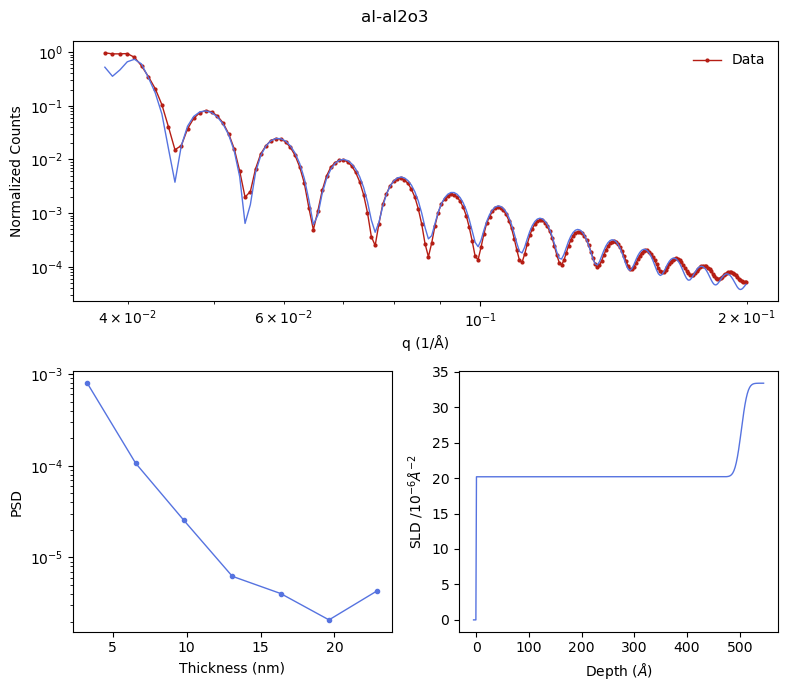

1.393712961988508: : 79it [00:09,  8.07it/s] 


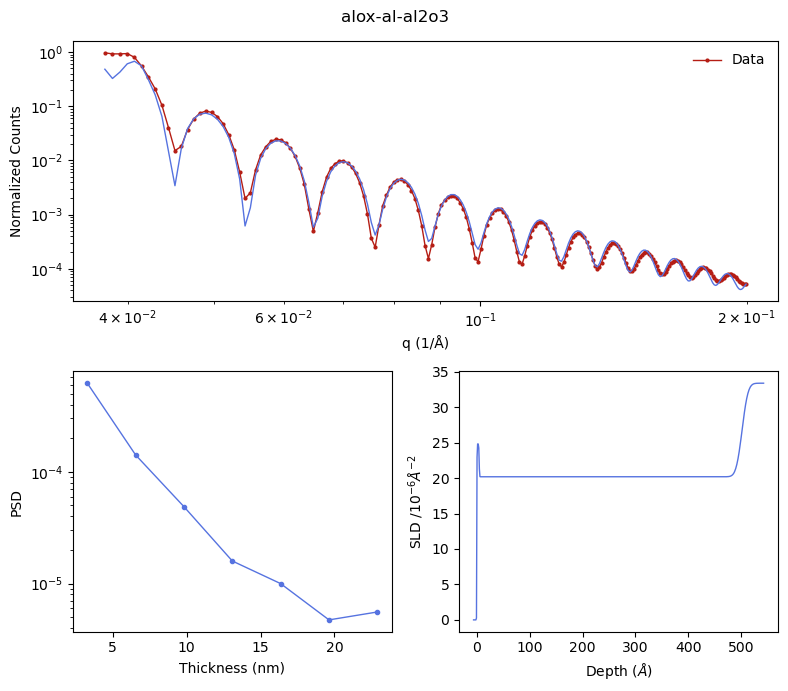

0.8583715788594979: : 180it [00:32,  5.55it/s]


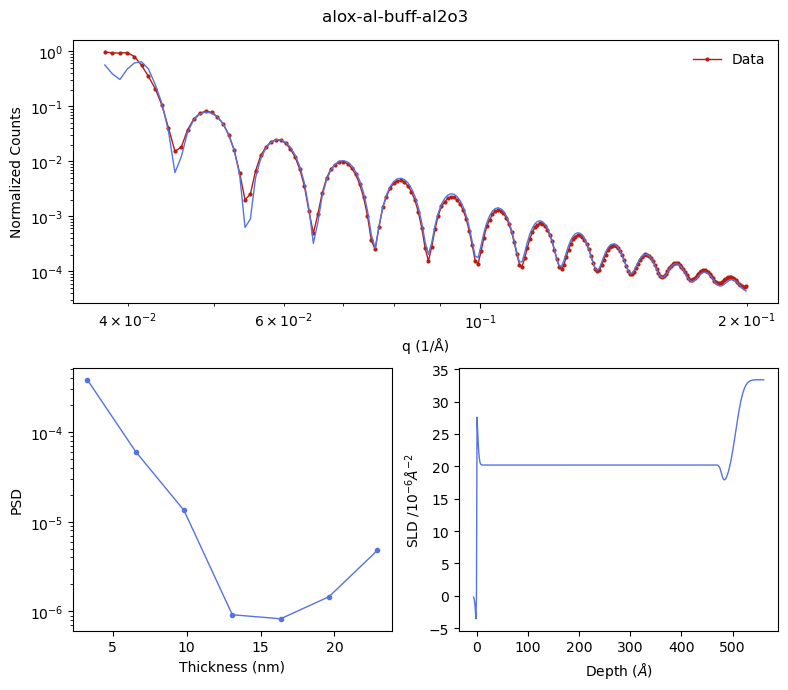

2.106241866735377: : 163it [00:27,  5.91it/s] 


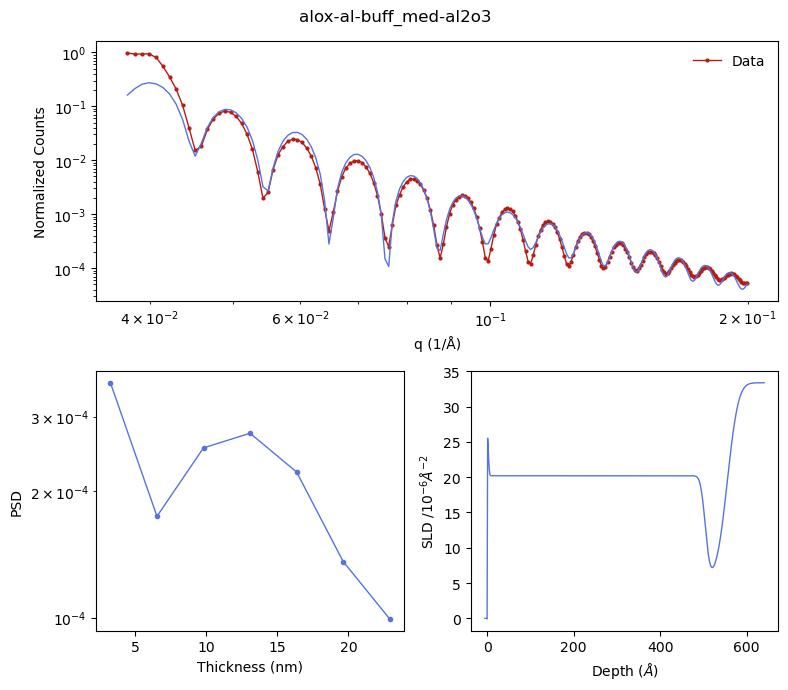

2.603254652250812: : 46it [00:04,  9.75it/s] 


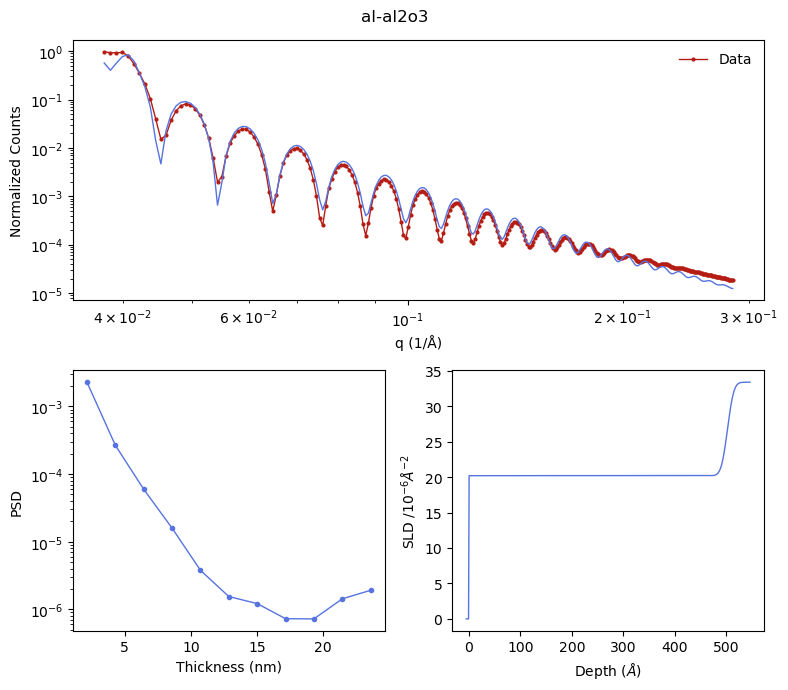

1.5629023293098647: : 95it [00:15,  6.17it/s]


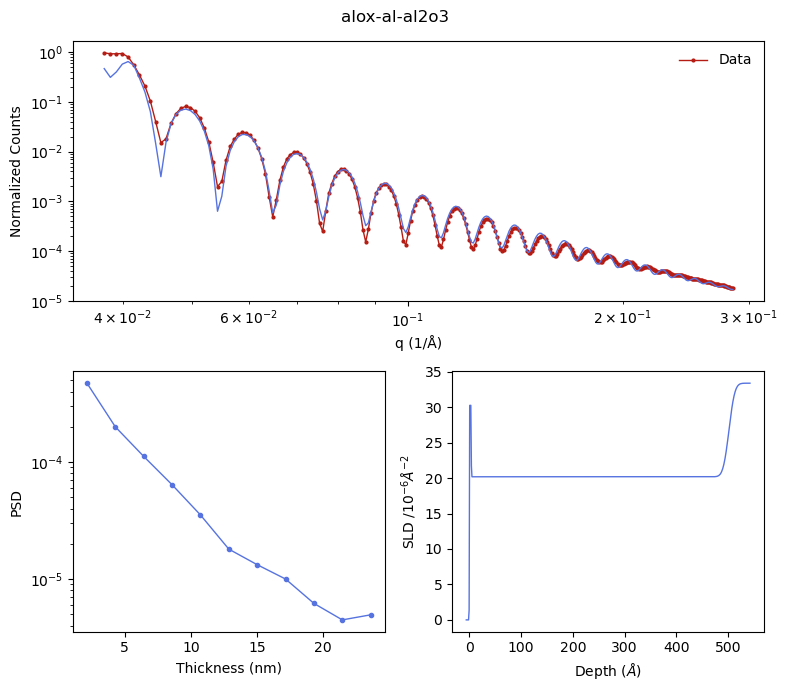

0.23935907859608957: : 266it [00:55,  4.78it/s]


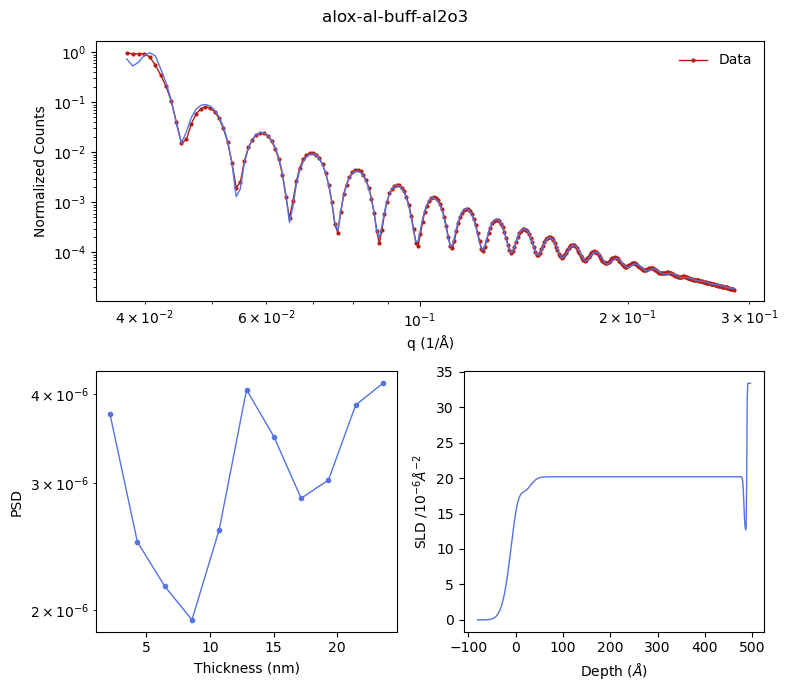

0.9145372911091249: : 248it [00:54,  4.57it/s]


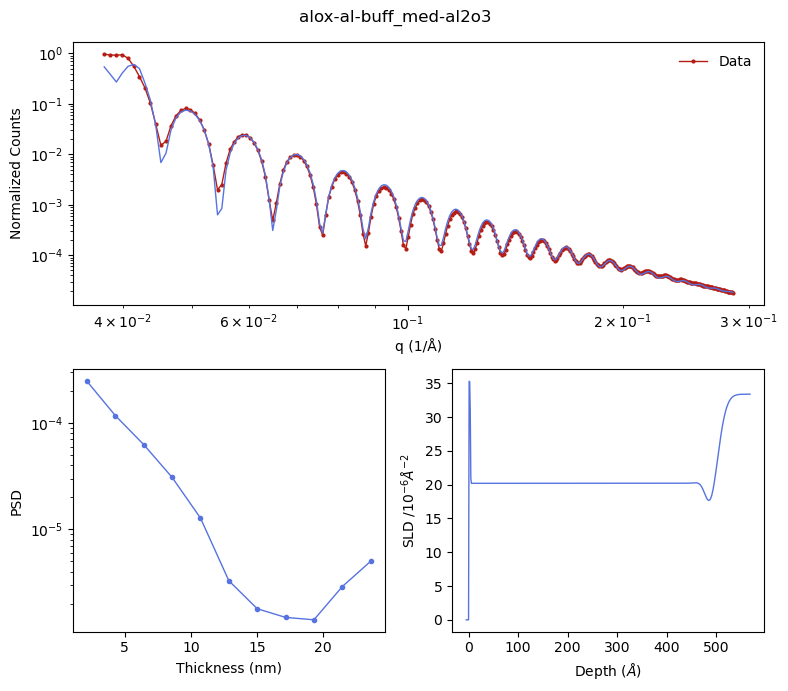

4.119050259470326: : 51it [00:06,  8.50it/s] 


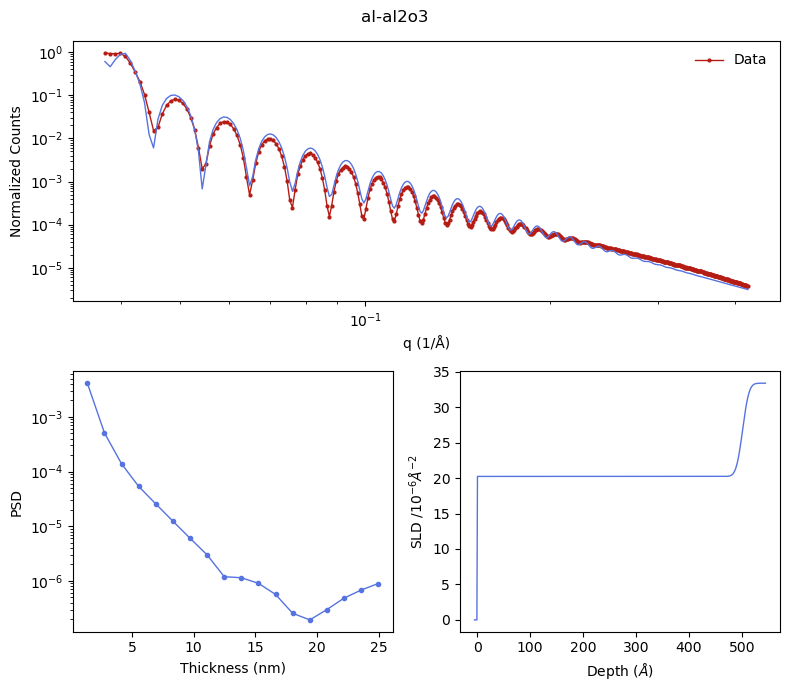

1.6809974182067624: : 121it [00:22,  5.29it/s]


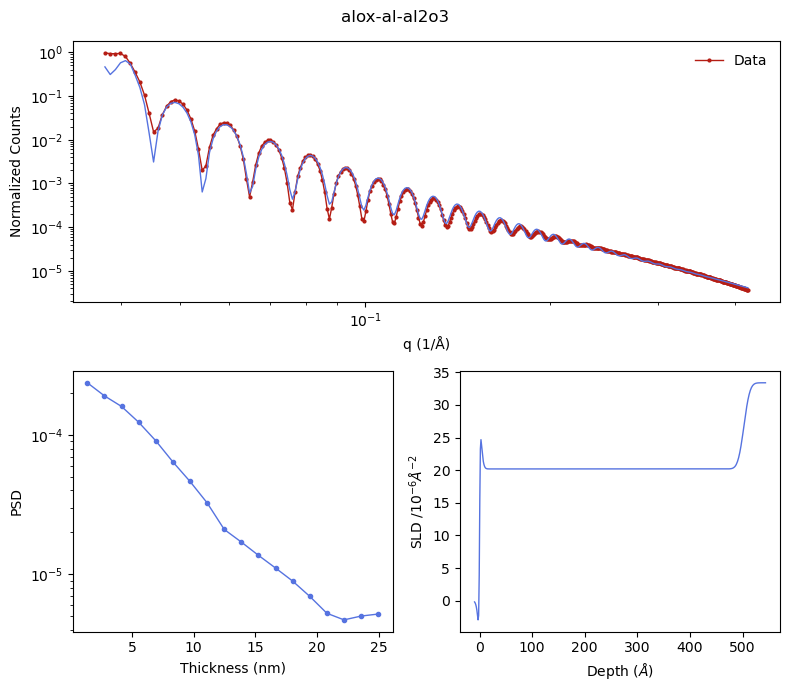

1.0221736176412535: : 248it [00:58,  4.26it/s]


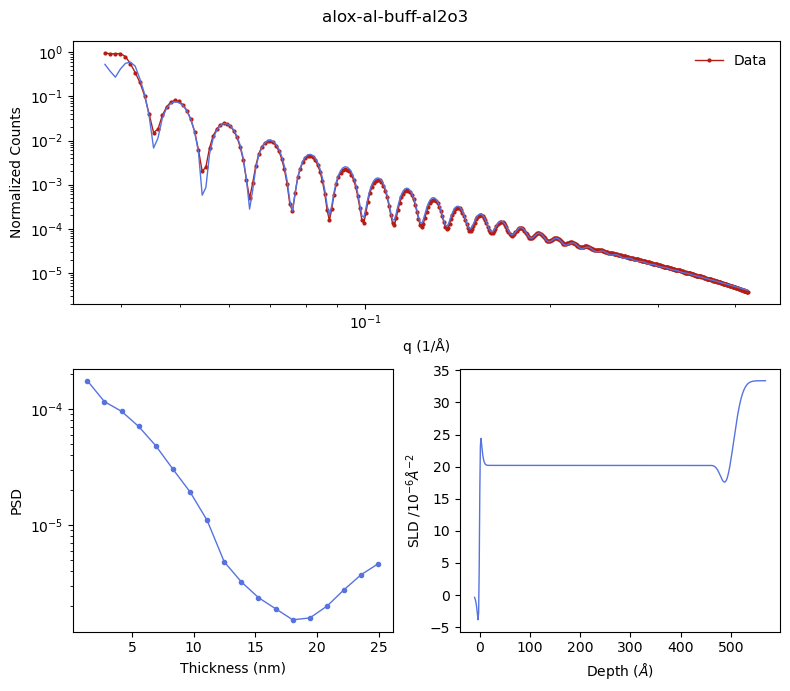

1.0030892435448309: : 381it [01:31,  4.15it/s]


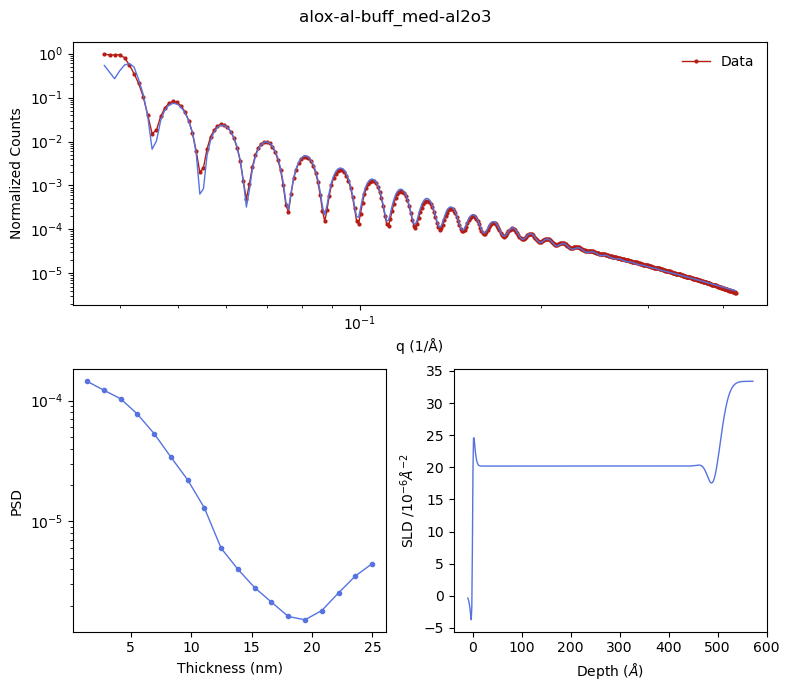

6.401246059022933: : 42it [00:05,  7.14it/s]


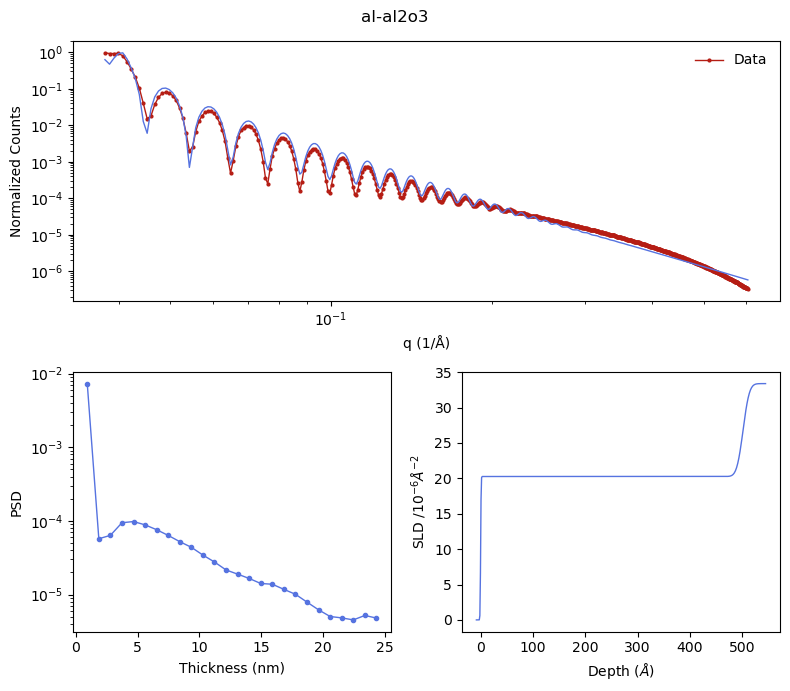

1.8635911053992926: : 150it [00:29,  5.10it/s]


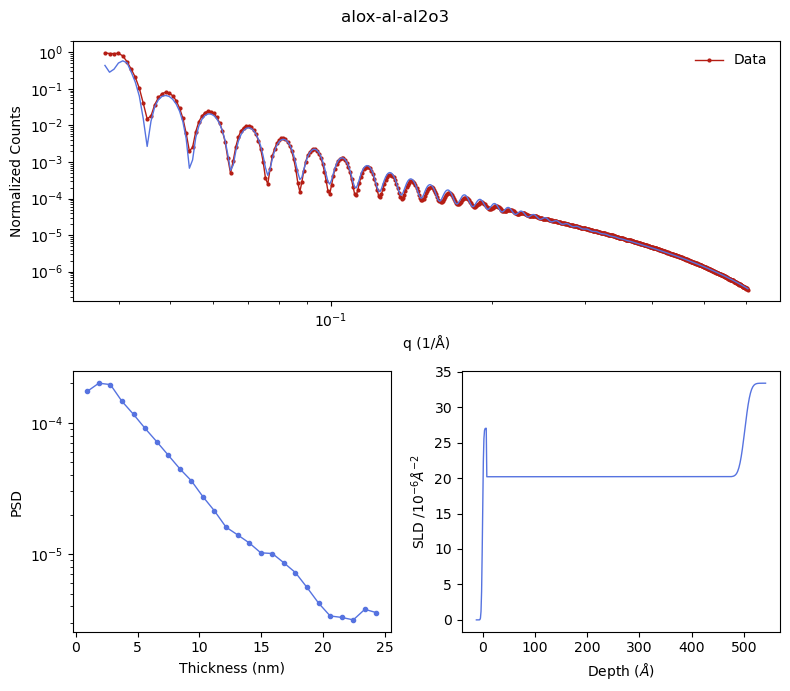

1.1522612811206057: : 274it [01:14,  3.70it/s]


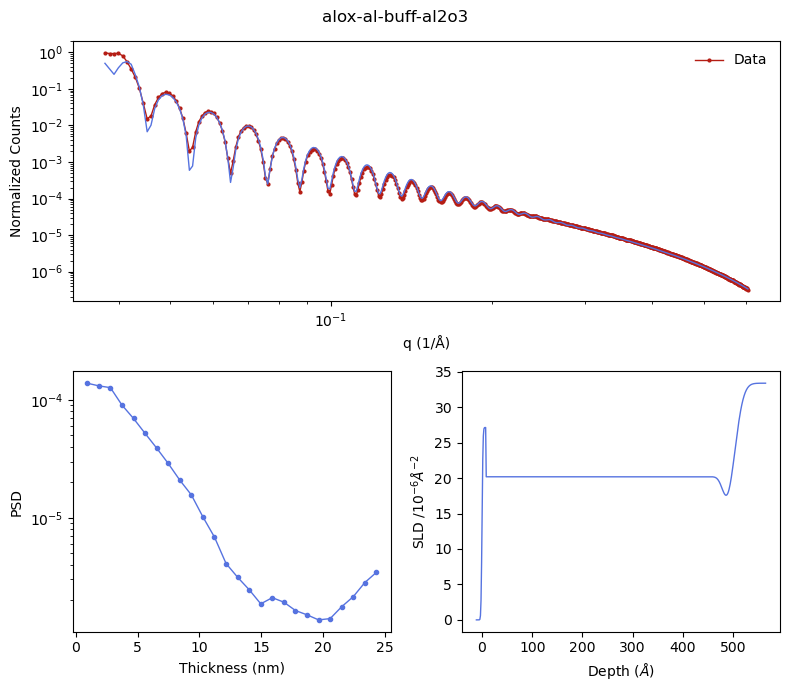

0.2838163874685611: : 424it [02:01,  3.48it/s] 


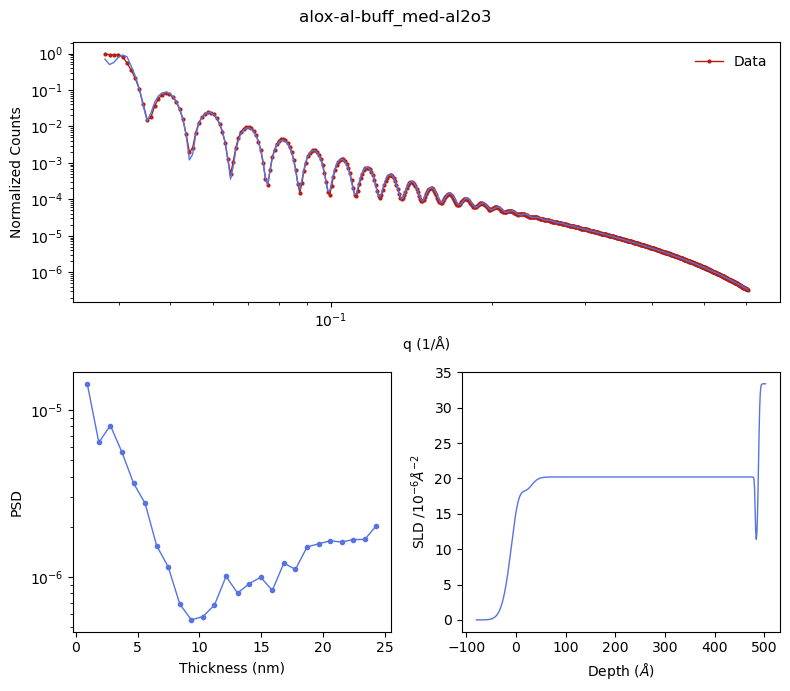

In [129]:
par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':23}
qrng = [0.037, 0.15]
        
layers = ['al', 'alox/al', 'alox/al/buff', 'alox/al/buff_med']
for i in range(len(layers)): 
    layers[i]=layers[i]+ '/al2o3'

out_lists = [[] for _ in range(len(layers))]
SLD_rng = [0.3, 0.1]
data_file = flist[0]

for i in range(4): 
    qrng[1]=0.2 + 0.06*i+0.025*i**2
    for j in range(len(layers)):
        par = {'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'x_err':1.9}
        par['thk']=[490]
        out_lists[j].append(ana_xrr.sim(pth + data_file, layers[j], par, qrng, SLD_rng=SLD_rng))

full_obj = ana_xrr.collect_obj(out_lists)
full_pars = ana_xrr.collect_pars(out_lists)

6


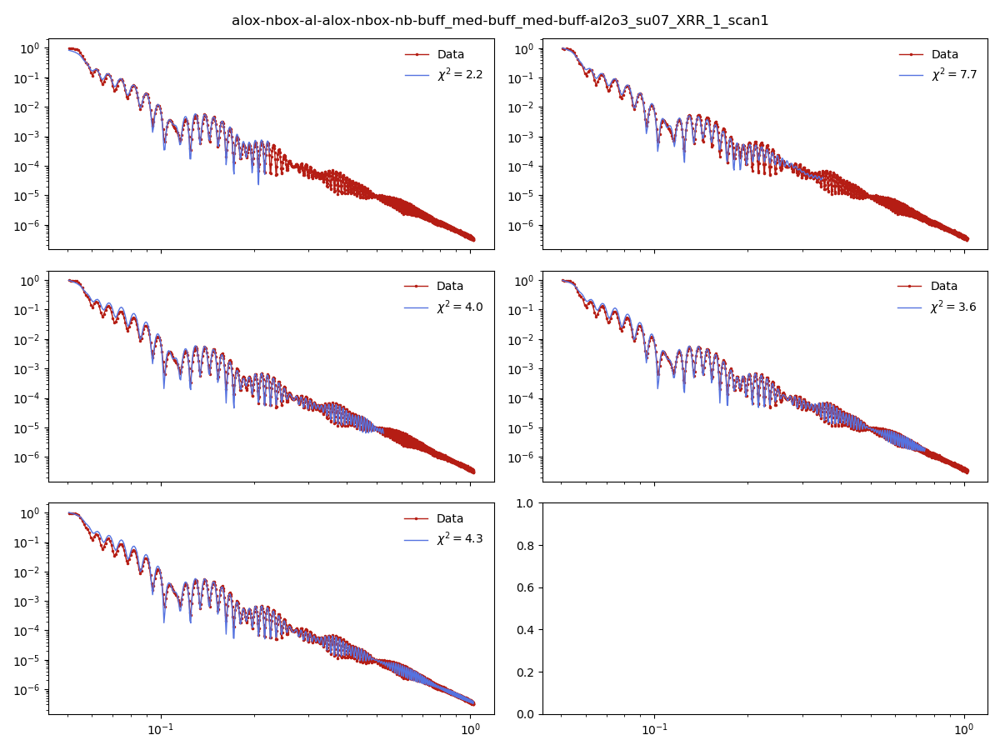

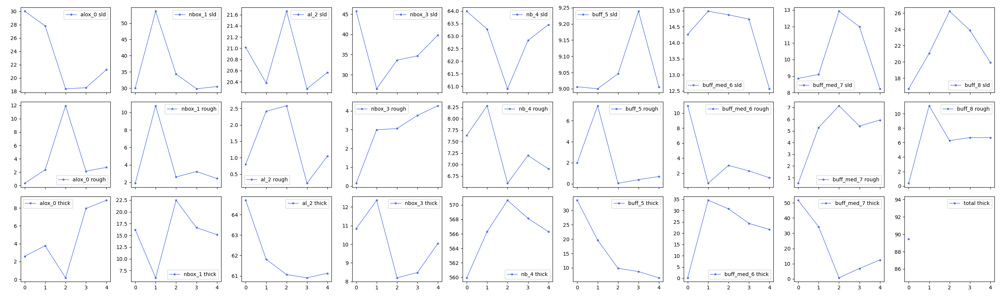

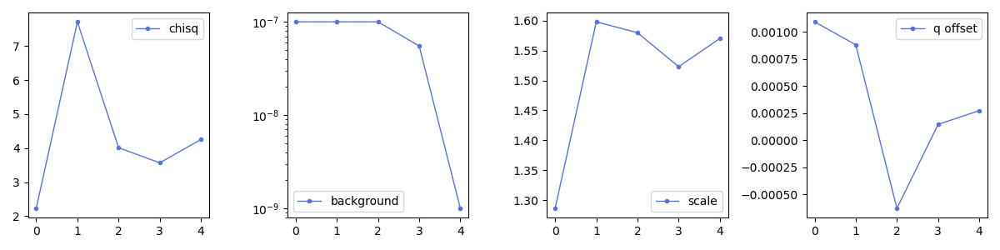

In [271]:
# This chooses one layer and plots all the different leghts 
%matplotlib widget
print(len(full_obj))
layer_ind =5
name_ind=0
ana_xrr.plot_obj_pane(full_obj[layer_ind], ['Data']*len(full_obj[layer_ind]), ind=len(full_obj[layer_ind])-1, path=img_pth, fname=layers[name_ind].replace('/', '-')+'_'+data_file[0:-4])

ana_xrr.compare_pars(full_pars[layer_ind], img_path=img_pth, fname=layers[name_ind].replace('/', '-')+'_'+data_file[0:-4])

In [275]:
layer_list = [layer.replace('/', '-') for layer in layers]
layer_list = np.linspace(1.5,2.5,6)
plot_ind = 0 
q_ind = 4
# outer is layers, inner is q range  
ana_xrr.plot_obj_pane(grab_ind(full_obj,q_ind), layer_list, ind=plot_ind, path=img_pth, fname='diff_layers_'+data_file[0:-4])

IndexError: list index out of range

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


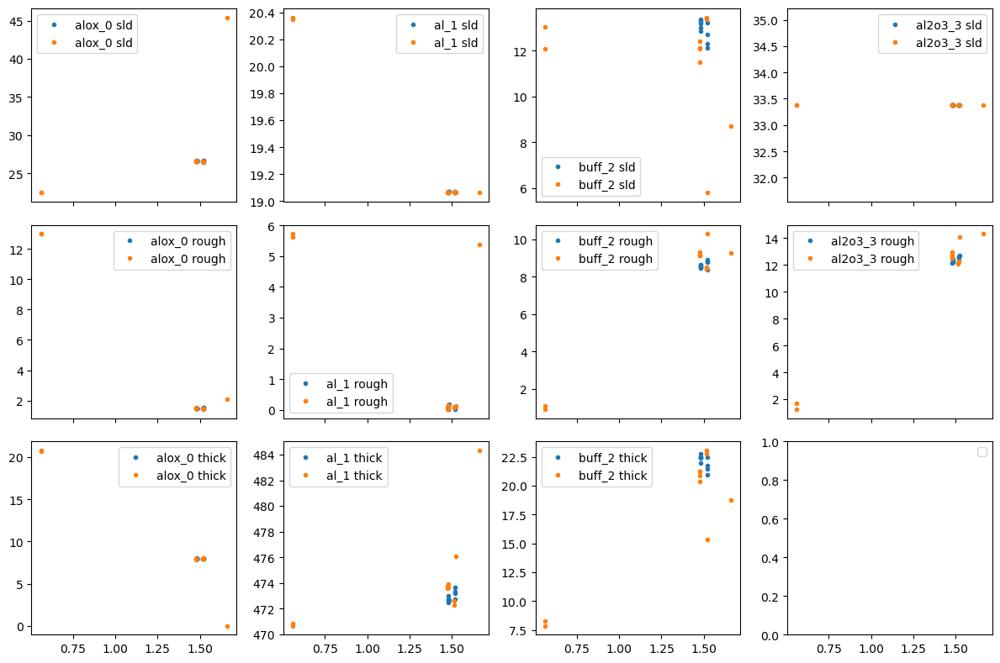

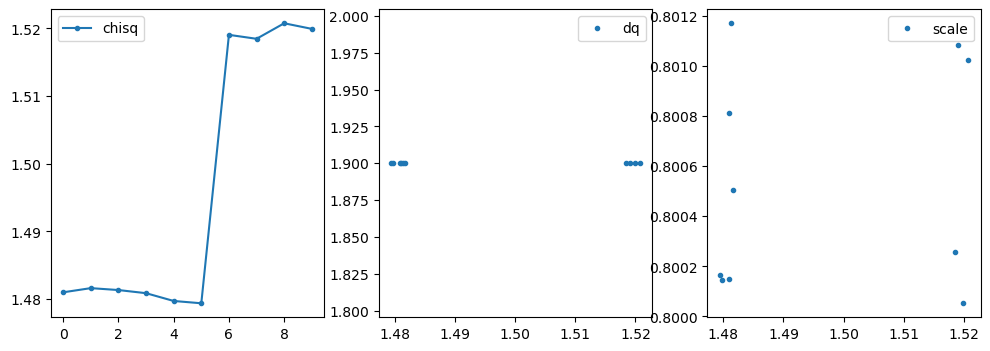

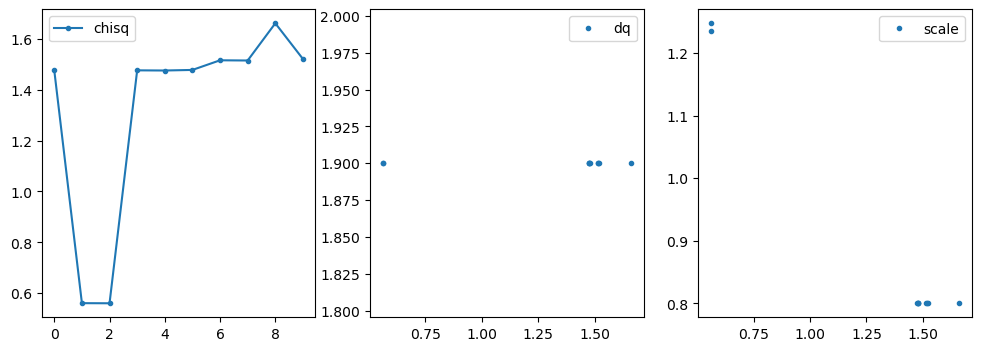

In [238]:
# fig, ax = plt.subplots(3,3, figsize=(9,9))
# ax = ax.flatten()
# ax[0].plot(wide['chisq'], wide['sld']['alox_0'],'.')
pars = [o[1] for o in outs]

sns.set_palette('tab10')

pp=wide

nlays = len(pp['sld'].keys())
fig, ax = plt.subplots(3, nlays, figsize=(nlays*3, 8), sharex=True)

ax = ax.flatten()
#thk=
for i, layer in enumerate(pp['sld'].keys()):
    #thk = pp['thick'][layer]+thk
    ax[i].plot(pp['chisq'], pp['sld'][layer], '.', label=layer+' '+'sld')
    ax[i+nlays].plot(pp['chisq'], pp['rough'][layer], '.', label=layer+' '+'rough')
    if i < nlays-1: 
        ax[i+2*nlays].plot(pp['chisq'], pp['thick'][layer], '.', label=layer+' '+'thick')
    #else: 
        #ax[i+2*nlays].plot(np.sum(pp['chisq'], pp['thick'][layer][0:-2]), '.-', label='total thick')

for a in ax: 
    a.legend()

fig.tight_layout()

fig2, ax2 = plt.subplots(1,3, figsize=(12, 4))
ax2[0].plot(pp['chisq'], '.-', label='chisq')
ax2[1].plot(pp['chisq'], pp['dq - resolution'], '.', label='dq')
ax2[2].plot(pp['chisq'], pp['scale'], '.', label='scale')
for a in ax2: 
    a.legend()

pp=narrow
for i, layer in enumerate(pp['sld'].keys()):
    #thk = pp['thick'][layer]+thk
    ax[i].plot(pp['chisq'], pp['sld'][layer], '.', label=layer+' '+'sld')
    ax[i+nlays].plot(pp['chisq'], pp['rough'][layer], '.', label=layer+' '+'rough')
    if i < nlays-1: 
        ax[i+2*nlays].plot(pp['chisq'], pp['thick'][layer], '.', label=layer+' '+'thick')
    #else: 
        #ax[i+2*nlays].plot(np.sum(pp['chisq'], pp['thick'][layer][0:-2]), '.-', label='total thick')

for a in ax: 
    a.legend()

fig.tight_layout()

fig, ax = plt.subplots(1,3, figsize=(12, 4))
ax[0].plot(pp['chisq'], '.-', label='chisq')
ax[1].plot(pp['chisq'], pp['dq - resolution'], '.', label='dq')
ax[2].plot(pp['chisq'], pp['scale'], '.', label='scale')
for a in ax: 
    a.legend()    

# Trilayers

In [10]:
flist[8]

'su01_XRR_1_remeas_scan1.txt'

52.8780359376036


6.052346640919357: : 205it [00:37,  5.50it/s]
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:415: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


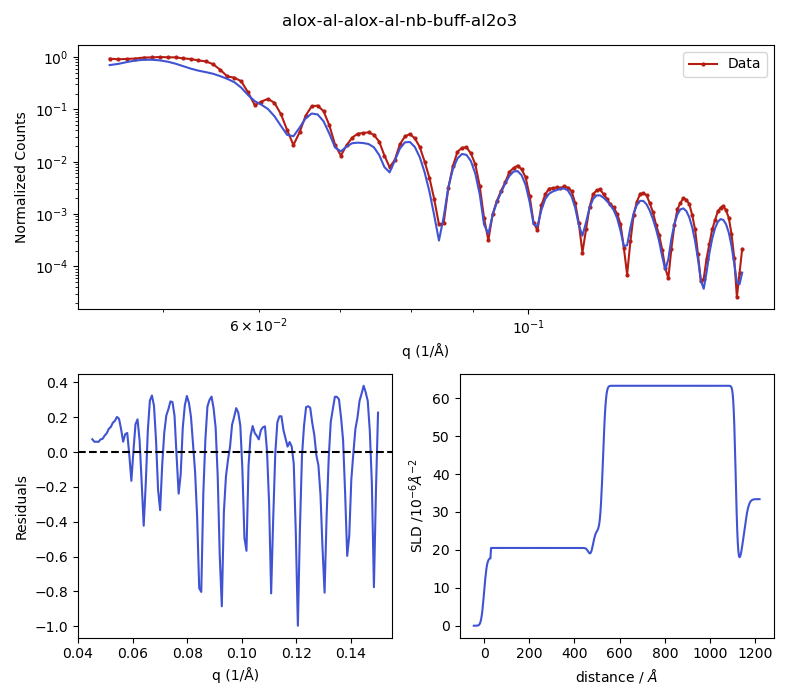

Layer Properties:
  Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
 alox_0      29.459139      10.116809          17.811052
   al_1     435.444532       0.275097          20.514052
 alox_2      16.197383       8.964069          17.051400
   al_3      45.235847      10.000000          25.074948
   nb_4     587.332414      10.000000          63.287613
 buff_5      36.429872       7.909551          15.257555
al2o3_6            inf      16.041210          33.380000

Additional Parameters:
       Parameter     Value
           Chisq 12.086073
Log10 Background -9.000000
 DQ - Resolution  1.500000
        Q Offset  0.001094
           Scale  1.385563
78.28261388501852


12.418029143536485: : 104it [00:21,  4.80it/s]
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:415: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


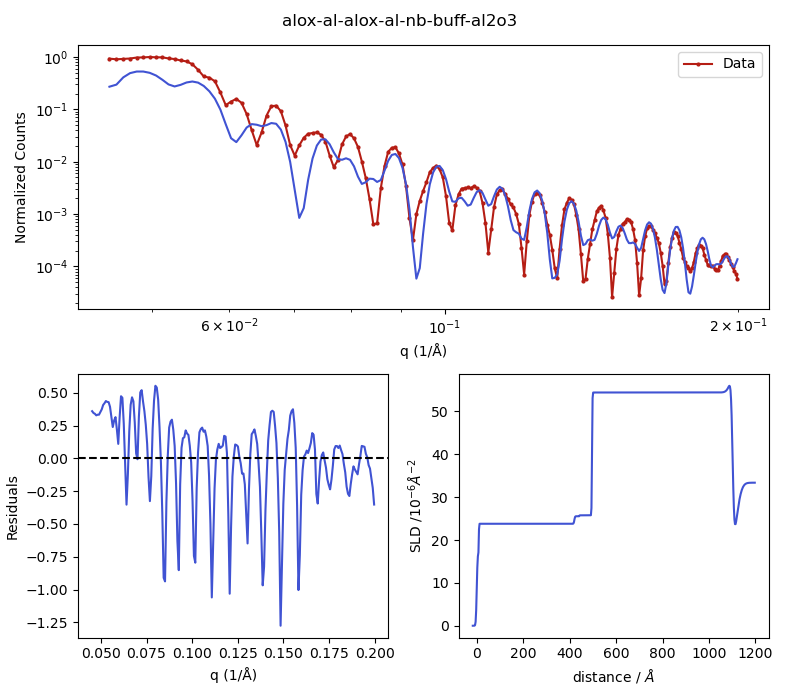

Layer Properties:
  Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
 alox_0       9.000000       3.000000          17.051400
   al_1     411.306265       0.856124          23.794691
 alox_2      21.913293       2.289546          25.549420
   al_3      54.028956       0.541105          25.763014
   nb_4     605.402260       1.500000          54.429750
 buff_5      12.127729       5.814594          12.353116
al2o3_6            inf      19.558470          33.380000

Additional Parameters:
       Parameter     Value
           Chisq 24.570316
Log10 Background -9.000000
 DQ - Resolution  1.500000
        Q Offset -0.003859
           Scale  0.800000
103.11204871734198


15.170566170161587: : 82it [00:23,  3.55it/s]
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:415: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


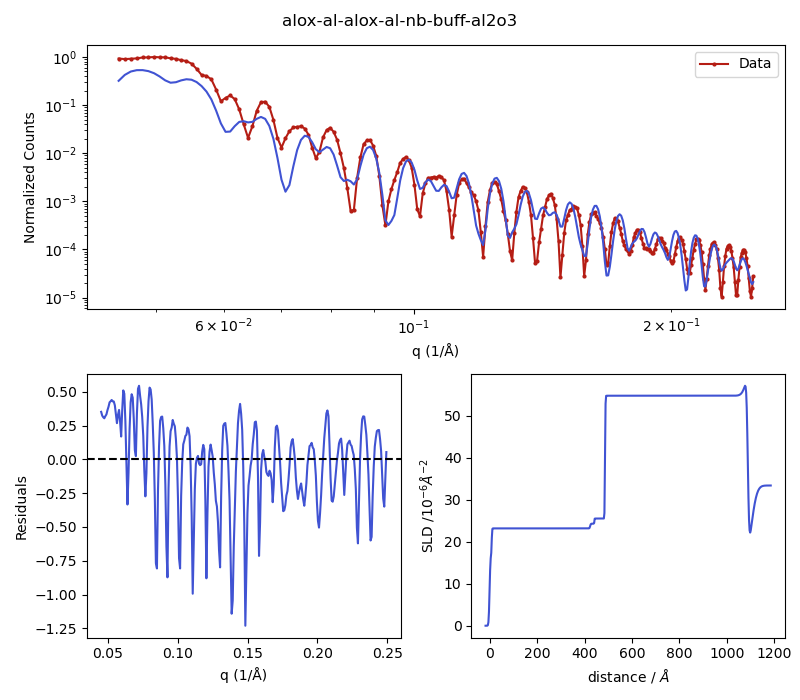

Layer Properties:
  Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
 alox_0       9.000000       3.000000          17.051400
   al_1     414.780774       1.337796          23.169061
 alox_2      17.575841       2.165273          24.288904
   al_3      45.000000       0.787736          25.513142
   nb_4     601.454056       1.500000          54.750571
 buff_5      11.843126       4.704572          11.130989
al2o3_6            inf      19.955094          33.380000

Additional Parameters:
       Parameter     Value
           Chisq 29.836811
Log10 Background -9.000000
 DQ - Resolution  1.500000
        Q Offset -0.003188
           Scale  0.800000
126.70084145735329


17.45237933305142: : 93it [00:27,  3.38it/s] 
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:415: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


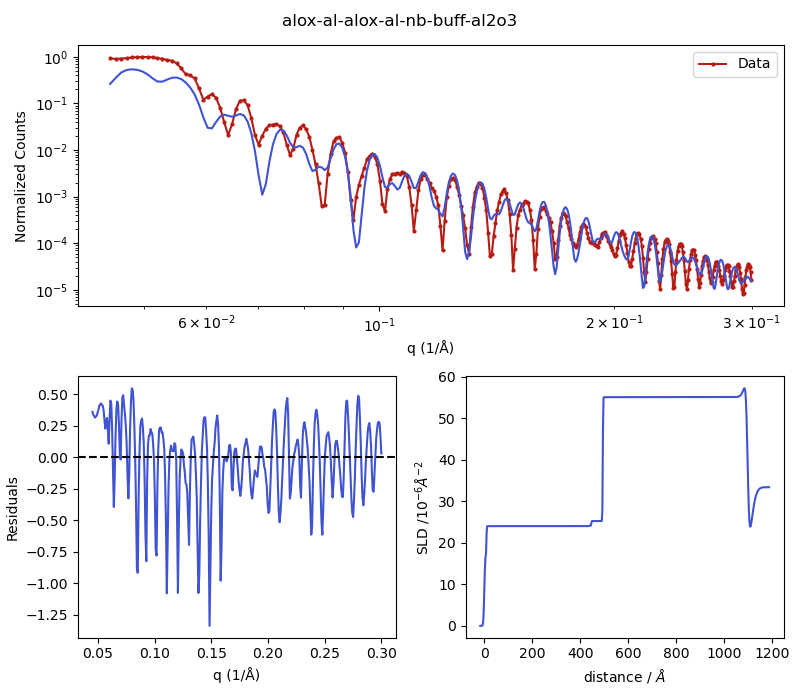

Layer Properties:
  Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
 alox_0       8.974338       2.998054          17.402215
   al_1     426.950998       0.813387          24.005724
 alox_2       9.799965       1.684136          24.122025
   al_3      47.630809       0.664535          25.227022
   nb_4     603.128279       1.223020          55.057690
 buff_5       9.316055       5.863933           9.802192
al2o3_6            inf      18.788043          33.380000

Additional Parameters:
       Parameter     Value
           Chisq 34.868082
Log10 Background -6.301030
 DQ - Resolution  1.500000
        Q Offset -0.003423
           Scale  0.810596
155.93173828159388


20.25422928493087: : 75it [00:24,  3.02it/s] 


KeyboardInterrupt: 

In [14]:
qrng = [0.045, 0.15]
par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':1.5, 'sub_rough_max':20}
par['thk']= [6, 400, 15, 50, 570,10, np.inf]
lay = 'alox/al/alox/al/nb/buff/al2o3'
outs=[]
#obj, par2 = ana_xrr.sim(pth + flist[13], 'alox/al/alox/nb/buff/al2o3', par, qrng)
for i in range(10):
    if i>0:        
    #obj, par = ana_xrr.refit(obj, pth + flist[13], qrng, fname='al-nb', img_path=img_pth)
        outs.append(ana_xrr.sim(pth + flist[8], lay, par, qrng, careful=True))
    else:
        outs.append(ana_xrr.sim(pth + flist[8], lay, par, qrng))
    qrng[1]=qrng[1]+0.05
    ana_xrr.generate_table(outs[-1][1])
    

In [308]:
print(flist)
len(flist)

['lv1_XRR_1_scan1.txt', 'lv2_XRR_1_scan1.txt', 'lv3_XRR_1_scan1.txt', 'lv4_XRR_1_scan1.txt', 'lv5_XRR_1_scan1.txt', 'lv6_XRR_1_redo_scan1.txt', 'lv6_XRR_1_scan1.txt', 'lv7_XRR_1_scan1.txt', 'su01_XRR_1_remeas_scan1.txt', 'su01_XRR_3_scan1.txt', 'su02_XRR_1_scan1.txt', 'su03_XRR_1_scan1.txt', 'su04_XRR_1_scan1.txt', 'su05_XRR_1_scan1.txt', 'su06_XRR_1_scan1.txt', 'su07_XRR_1_scan1.txt', 'su08_XRR_1_scan1.txt']


17

# Compare Al/Nb models

### Fit several models

1.6691687040847265: : 90it [00:12,  7.00it/s]


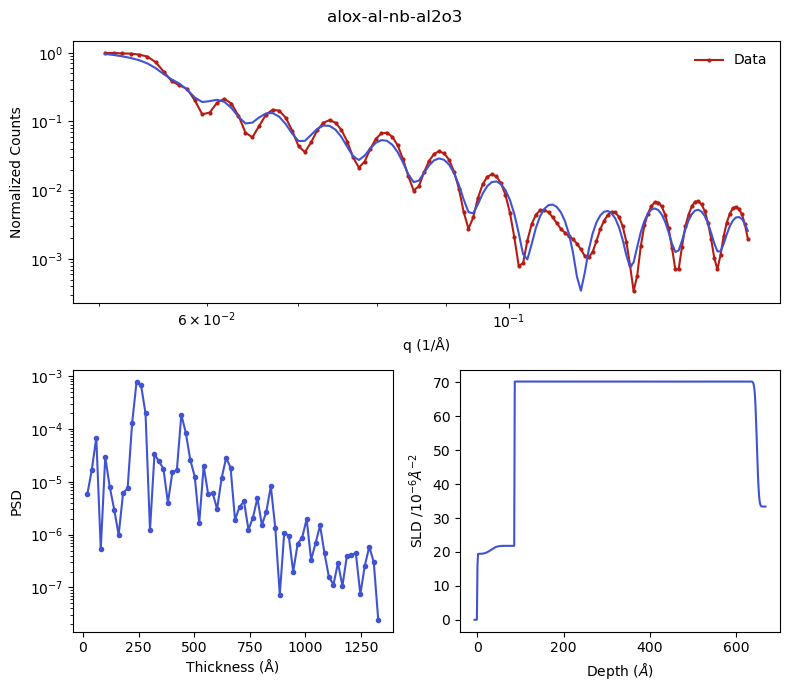

0.5591409498474371: : 233it [00:39,  5.97it/s]


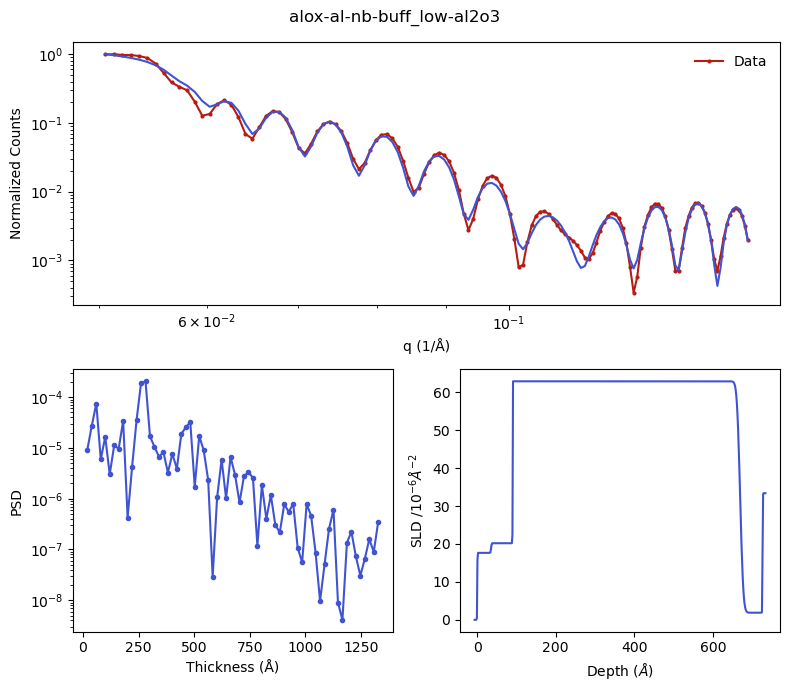

1.7977638160470542: : 511it [01:49,  4.67it/s]


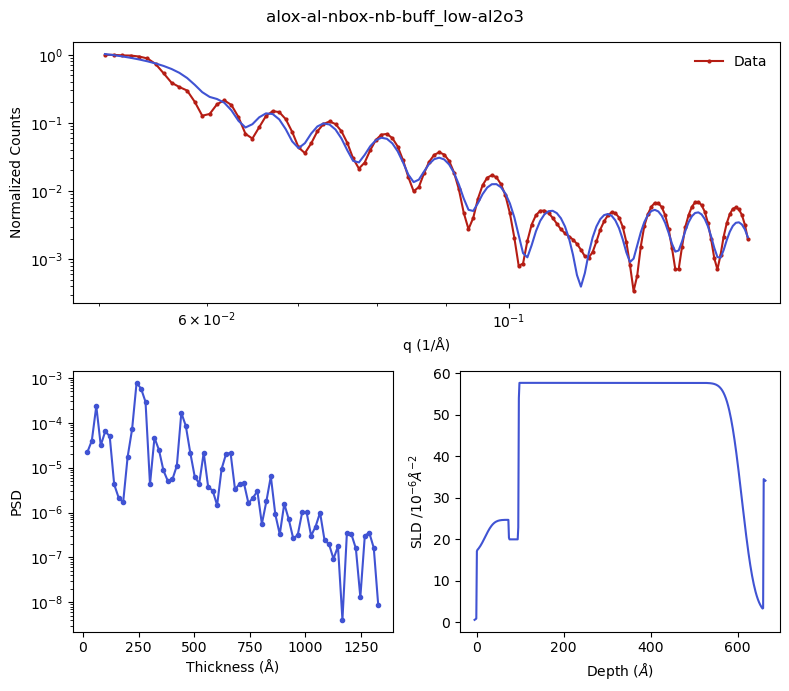

0.44066813018465023: : 612it [02:03,  4.95it/s]


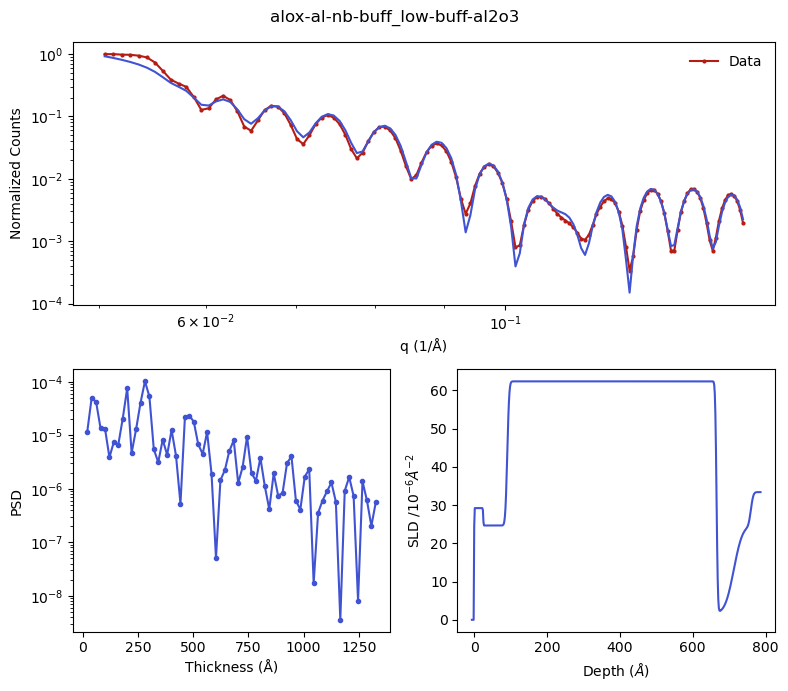

0.5322127550012374: : 1000it [04:15,  3.92it/s]


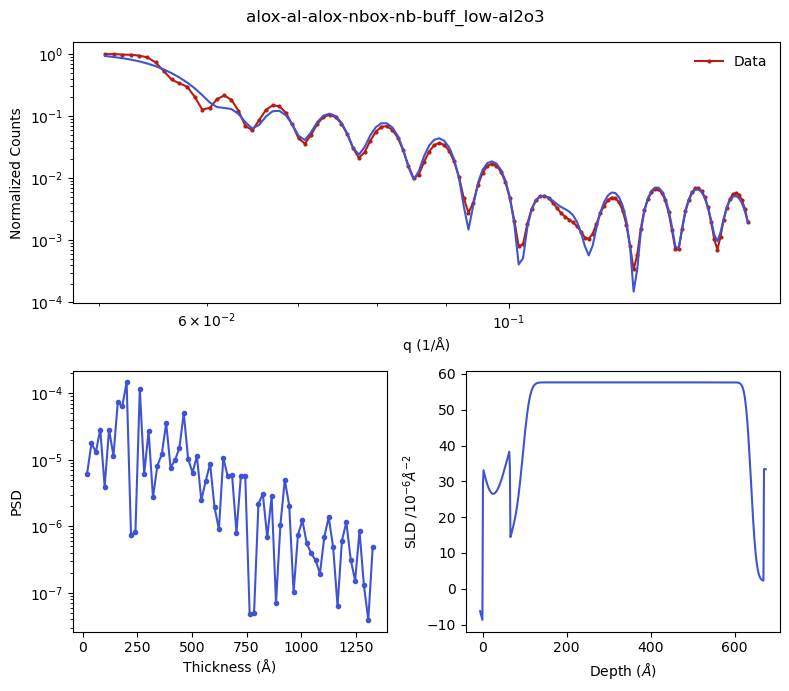

0.7476406581402354: : 541it [01:53,  4.75it/s]


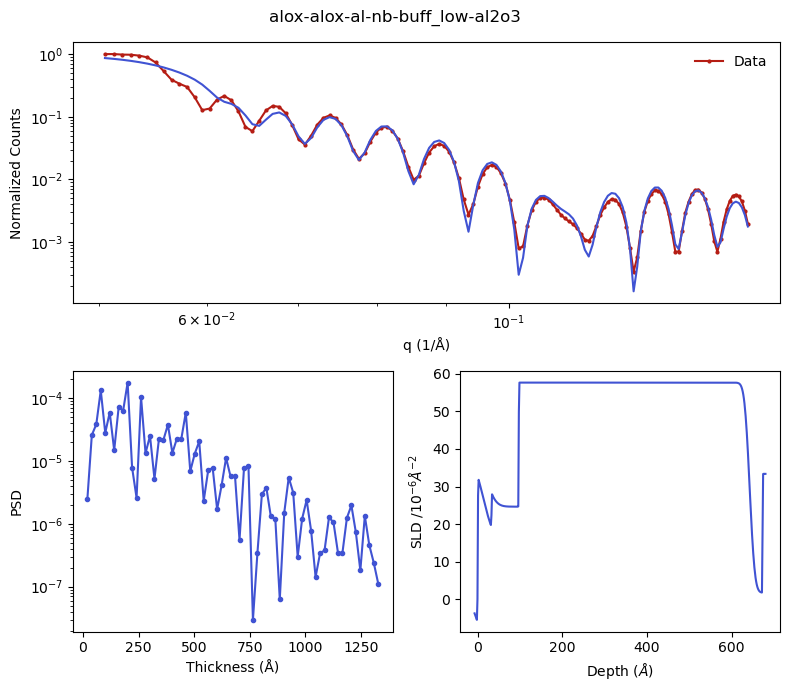

0.4200296329110278: : 1000it [04:00,  4.16it/s]


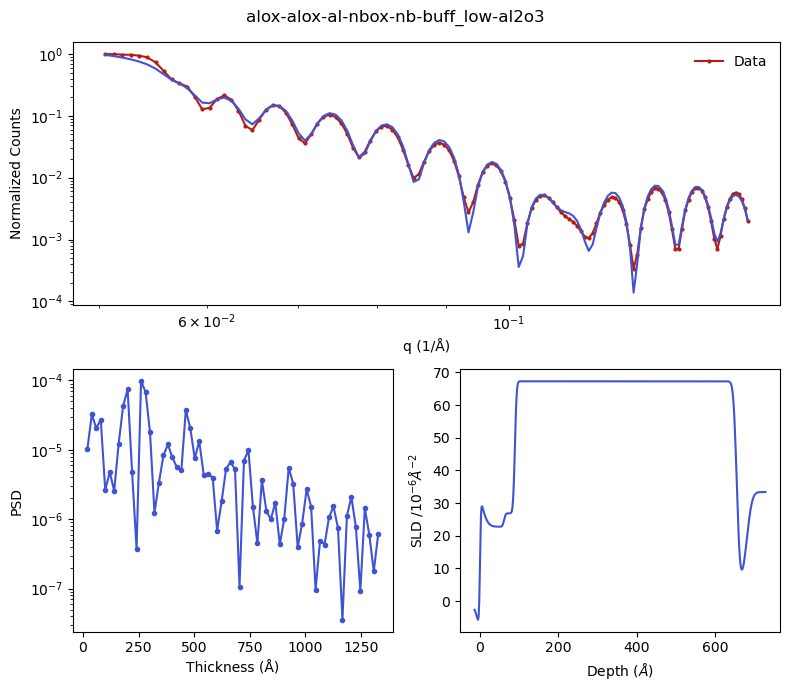

0.3896067307871822: : 1000it [04:52,  3.42it/s]


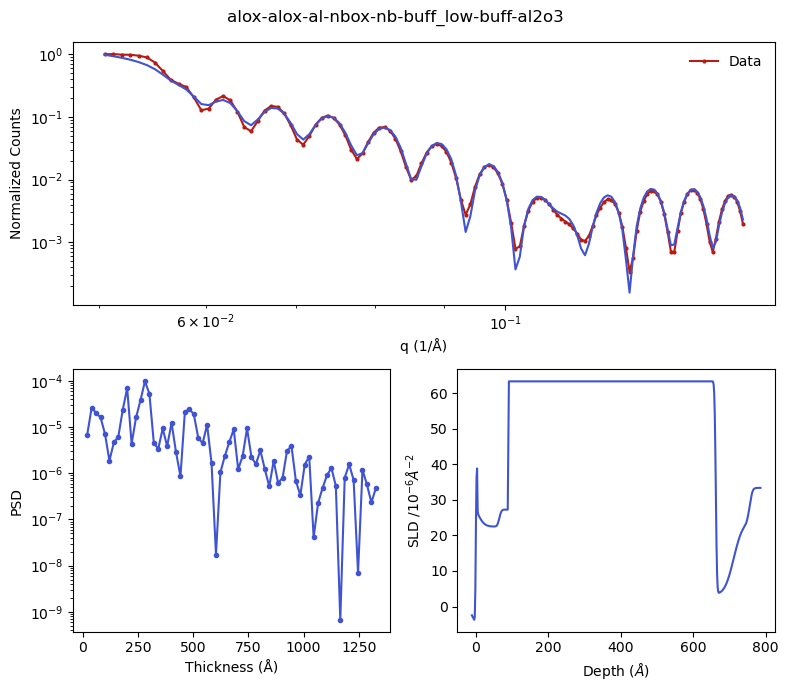

0.26814326608461087: : 1000it [05:42,  2.92it/s]


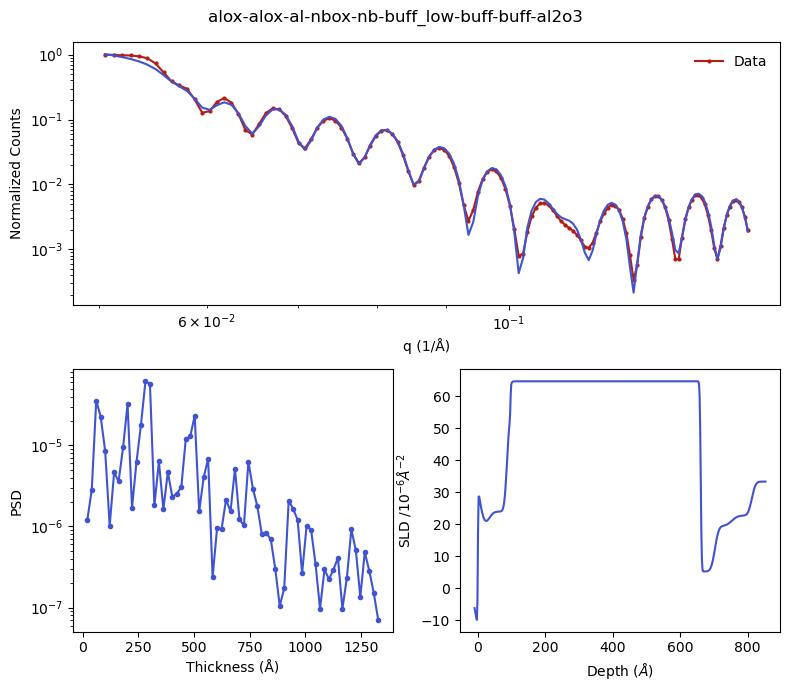

7.9160168648595945: : 65it [00:10,  6.40it/s]


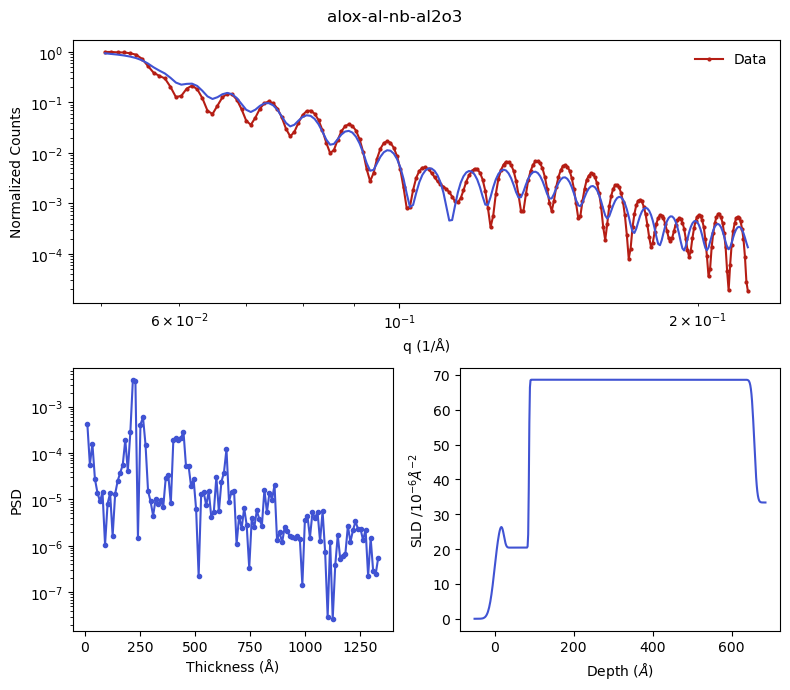

4.022766785896973: : 155it [00:31,  4.91it/s] 


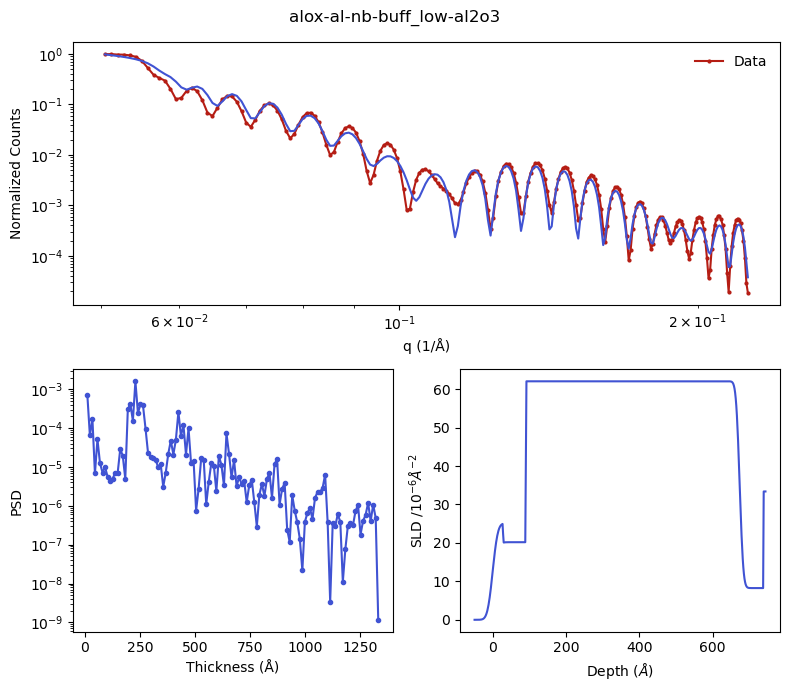

0.89641942720511: : 1000it [04:05,  4.08it/s] 


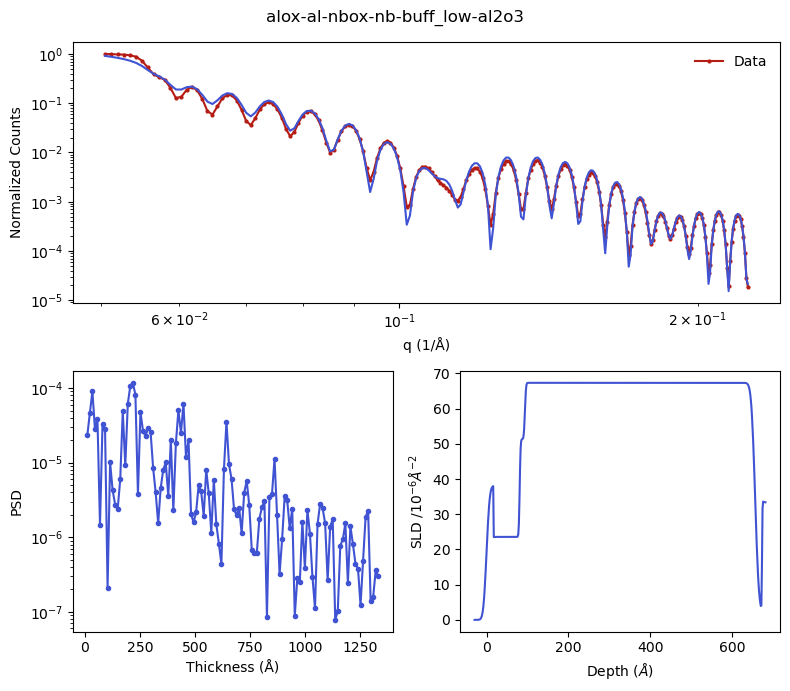

1.9852751155837391: : 288it [01:10,  4.06it/s]


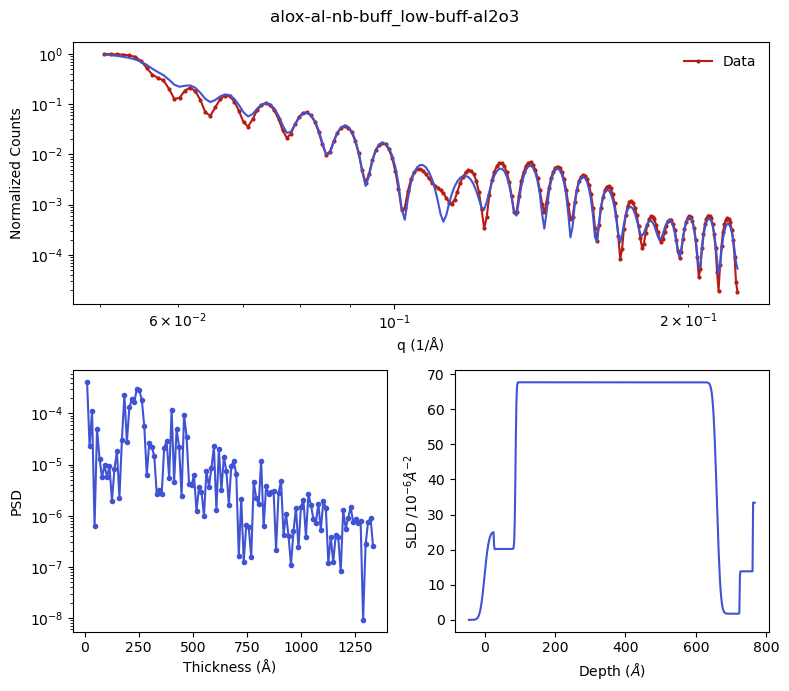

0.7349119891177271: : 946it [04:49,  3.27it/s]


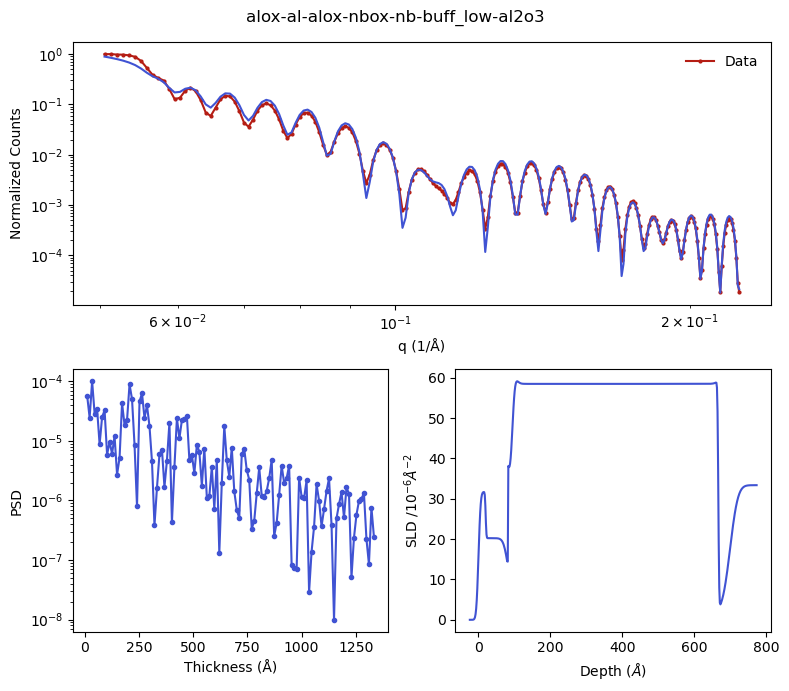

3.9526805894817487: : 235it [00:59,  3.96it/s]


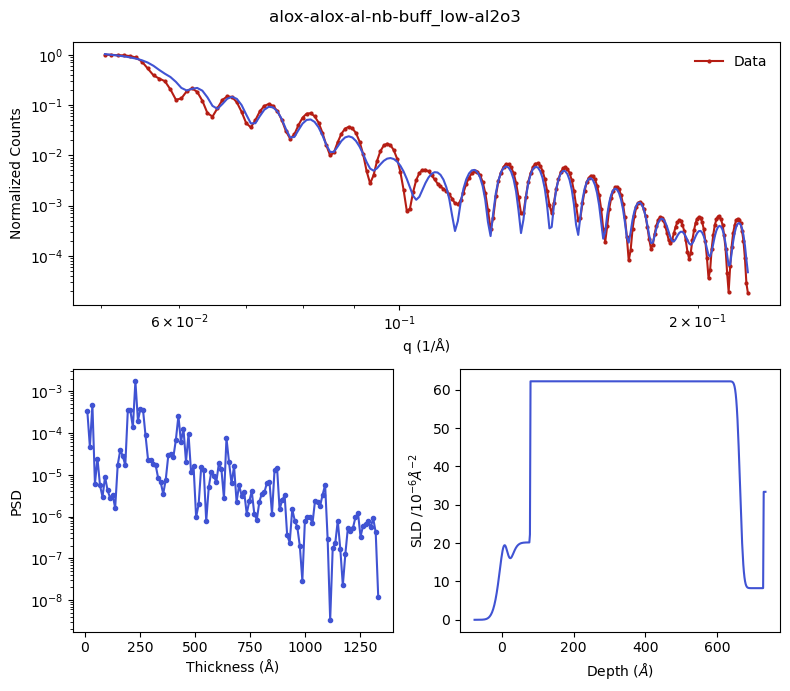

0.824183953023905: : 1000it [05:22,  3.10it/s]


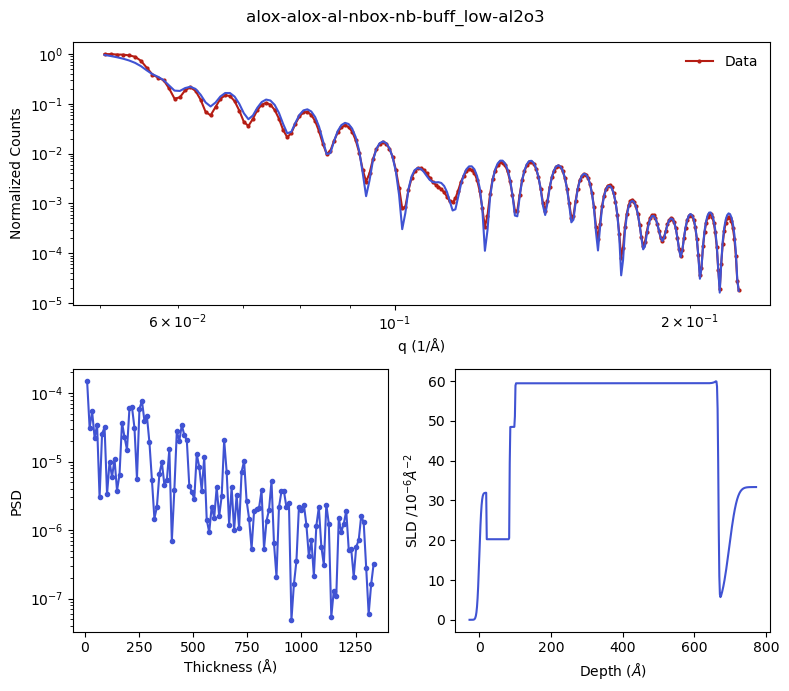

0.6581845944881383: : 1000it [06:12,  2.68it/s]


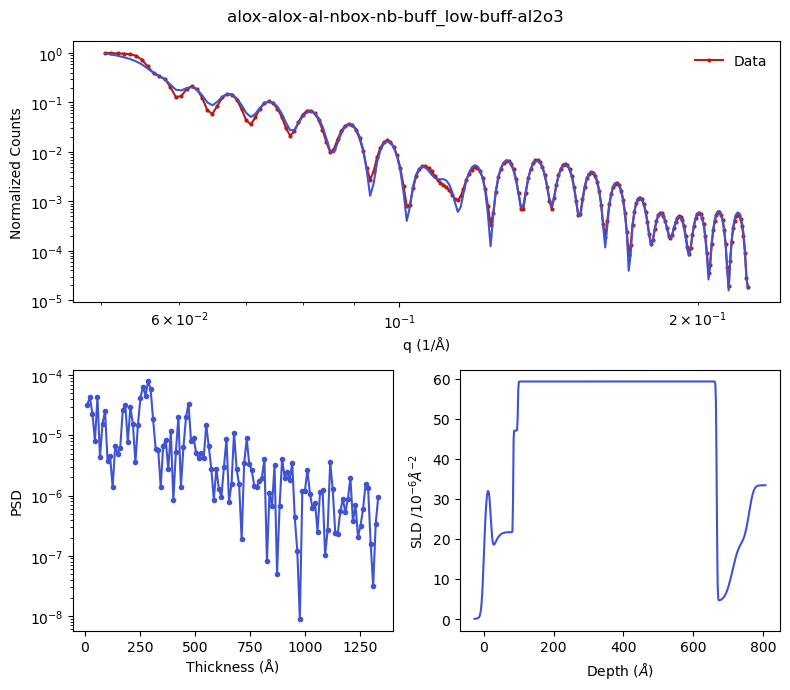

0.5811107730293312: : 1000it [07:33,  2.20it/s]


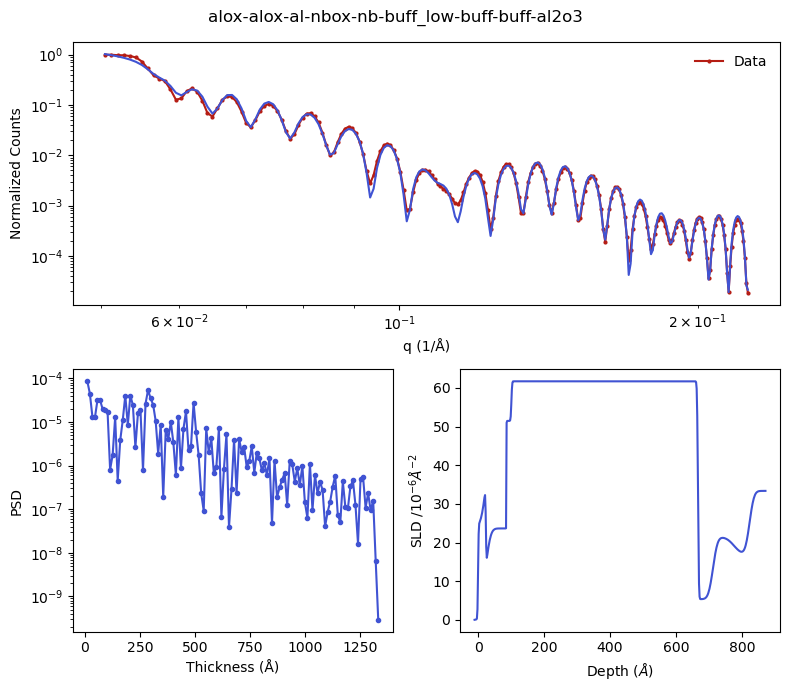

11.212683194092595: : 61it [00:11,  5.14it/s]


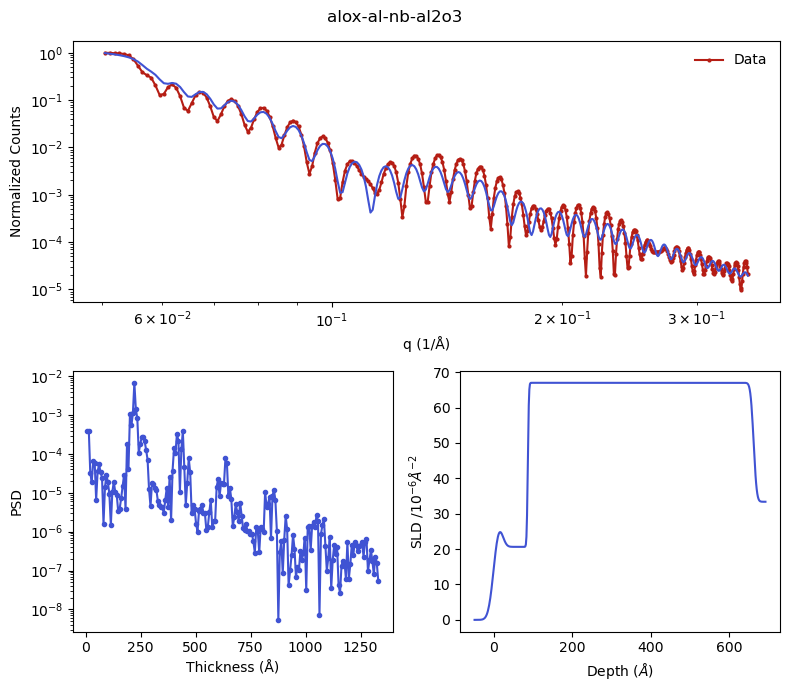

7.942587134365363: : 111it [00:29,  3.78it/s]


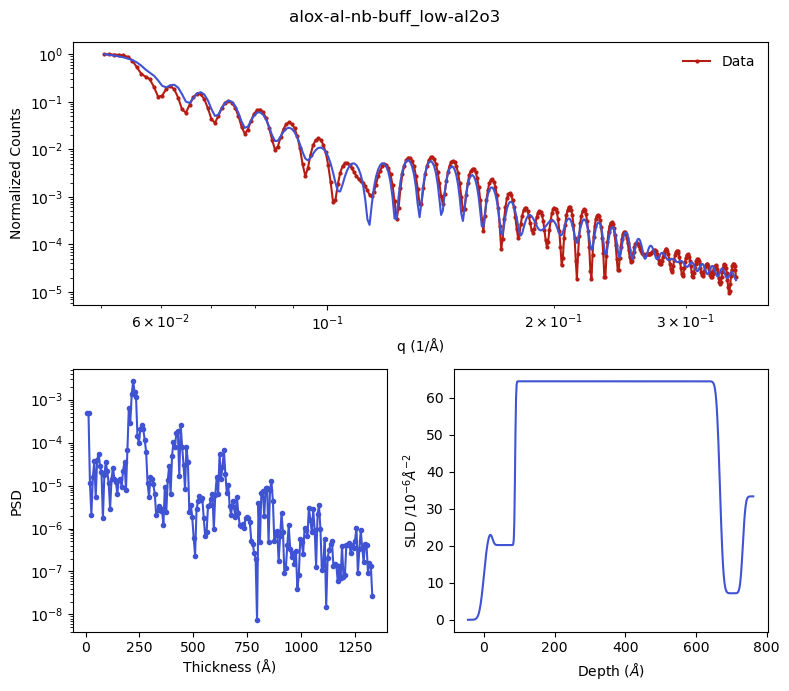

7.048382357950002: : 298it [01:35,  3.11it/s] 


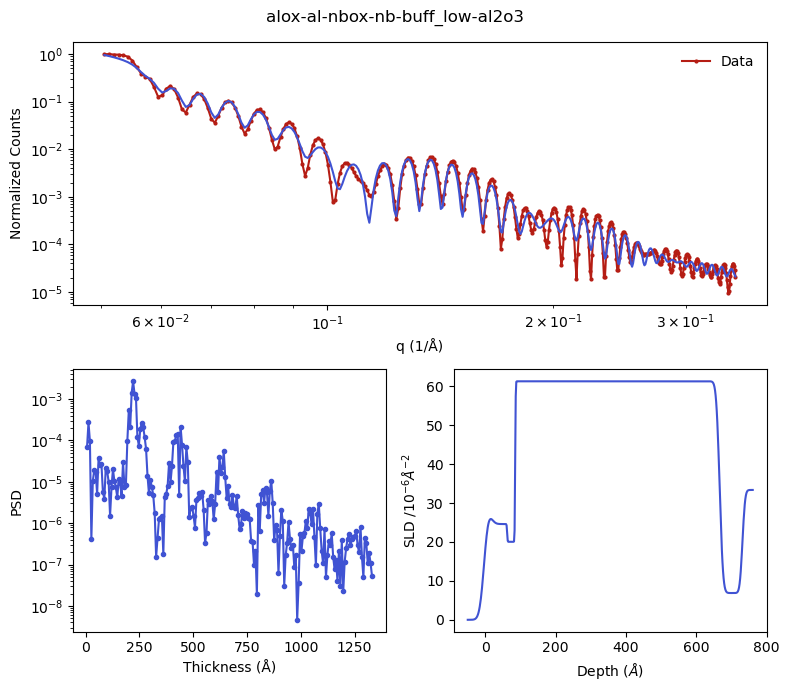

3.8394473899234653: : 180it [00:56,  3.19it/s]


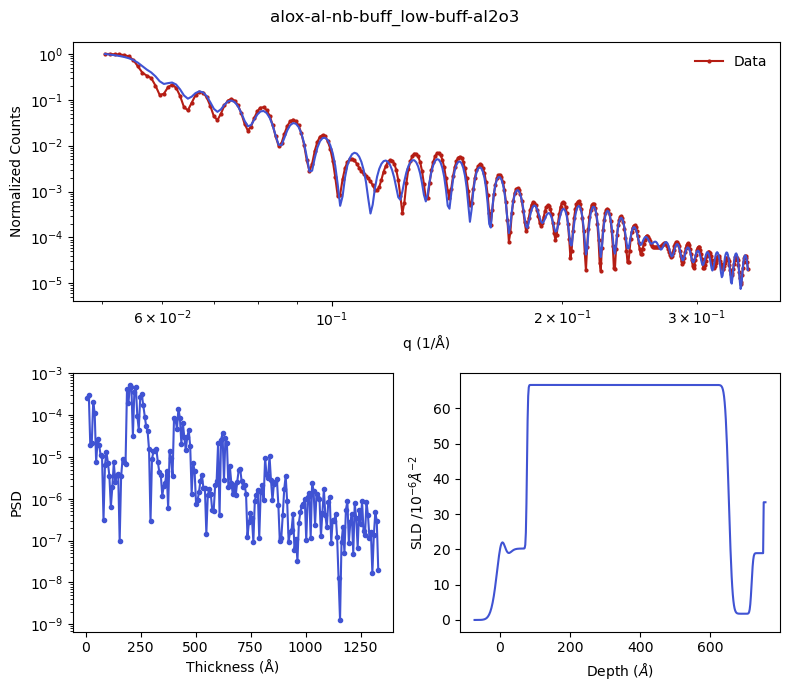

10.776289606494082: : 340it [02:13,  2.55it/s]


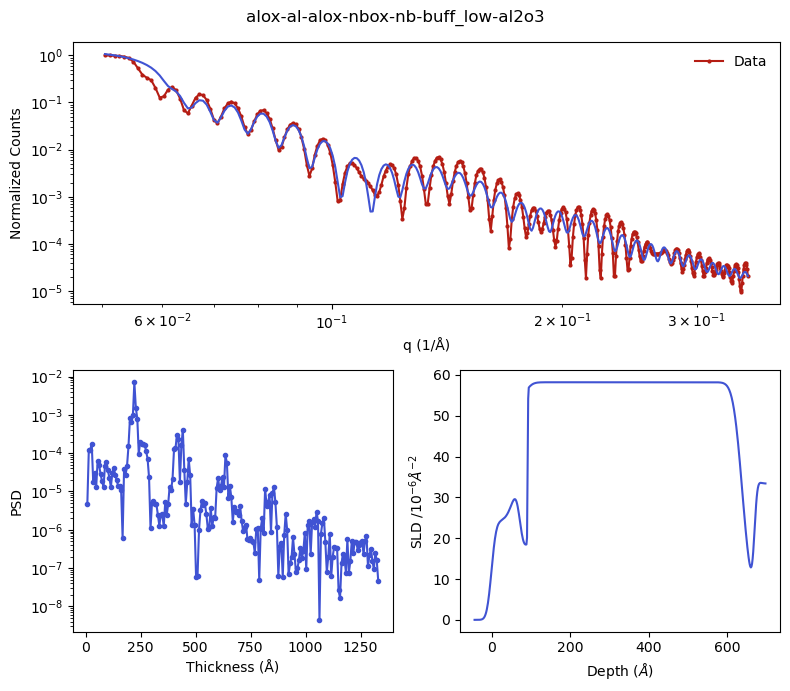

1.1845331793011669: : 409it [02:06,  3.22it/s]


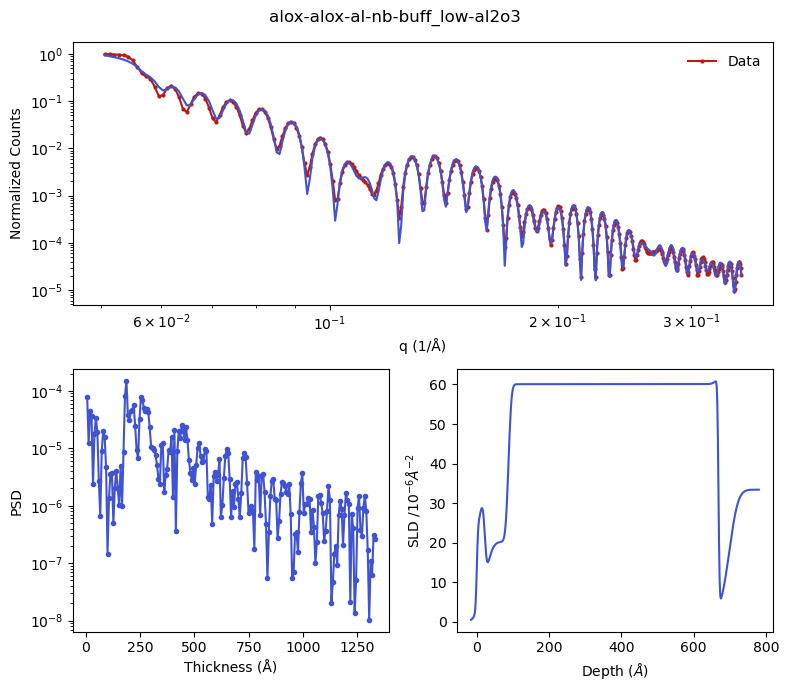

11.881098836837735: : 301it [01:59,  2.53it/s]


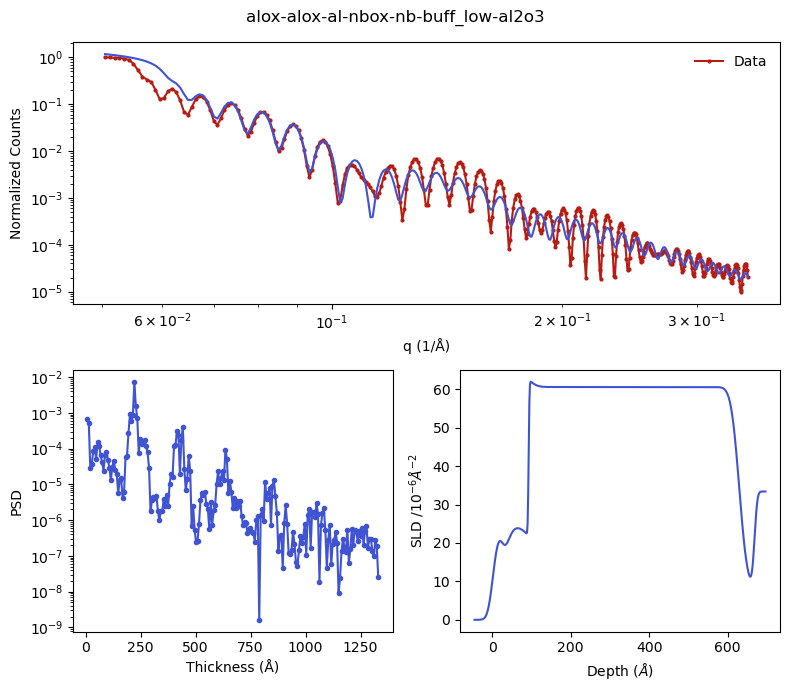

4.58827015077256: : 617it [1:20:27,  7.82s/it]   


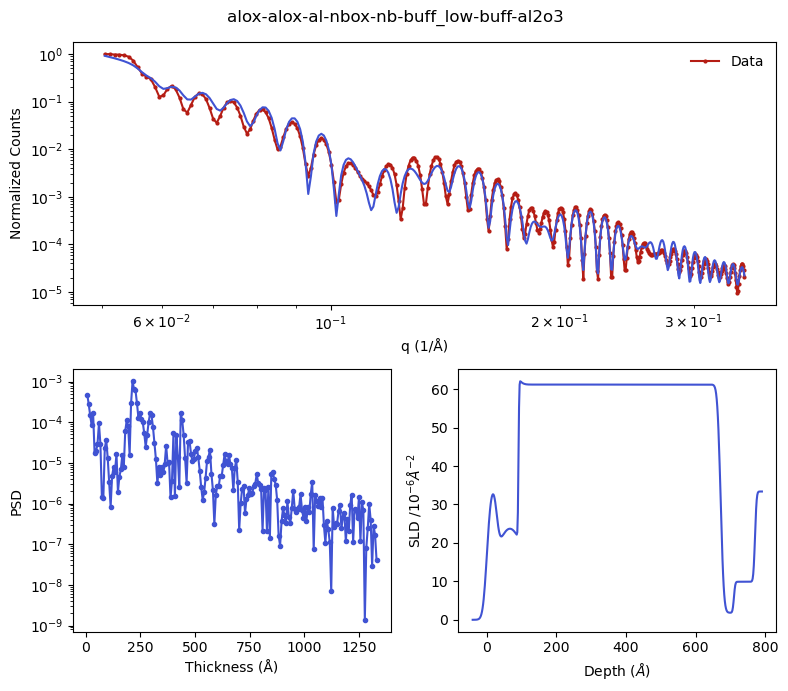

3.578285062226837: : 600it [05:17,  1.89it/s] 


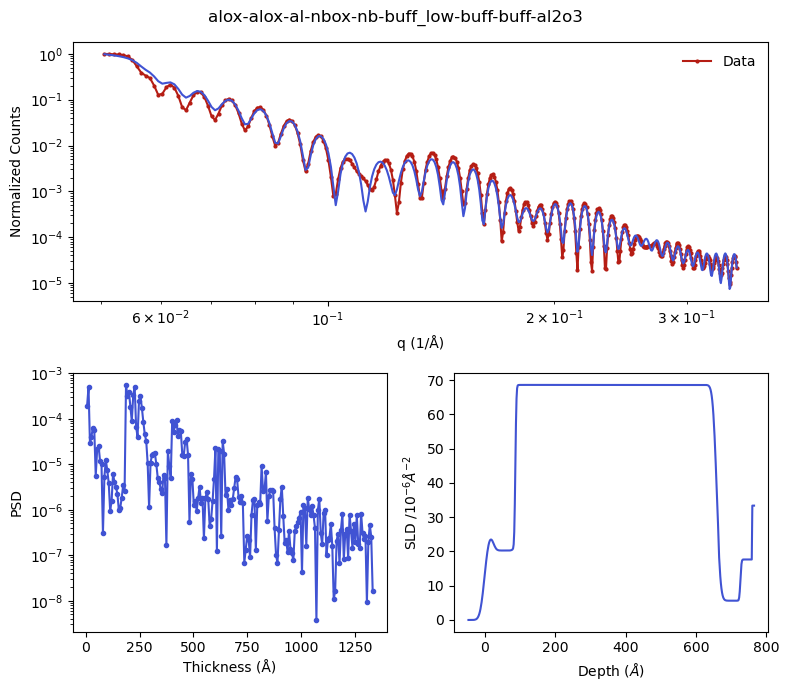

15.965312118384553: : 69it [00:15,  4.44it/s]


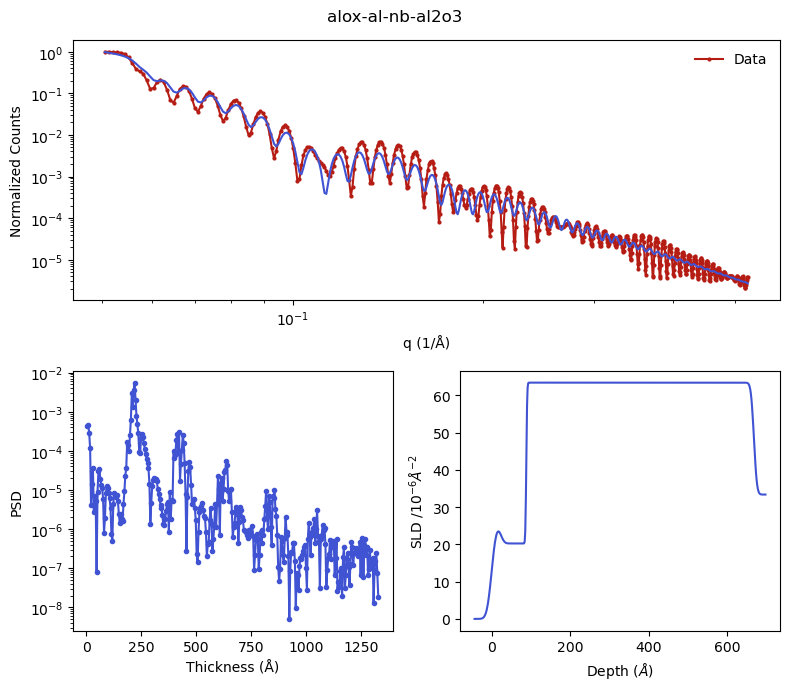

14.120527103471202: : 124it [00:37,  3.28it/s]


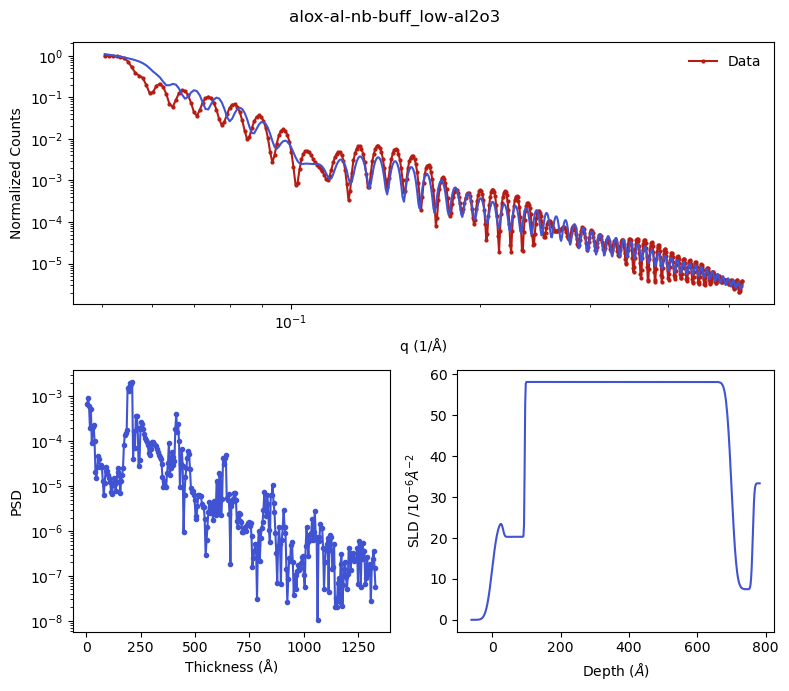

11.529693074866238: : 319it [02:38,  2.01it/s]


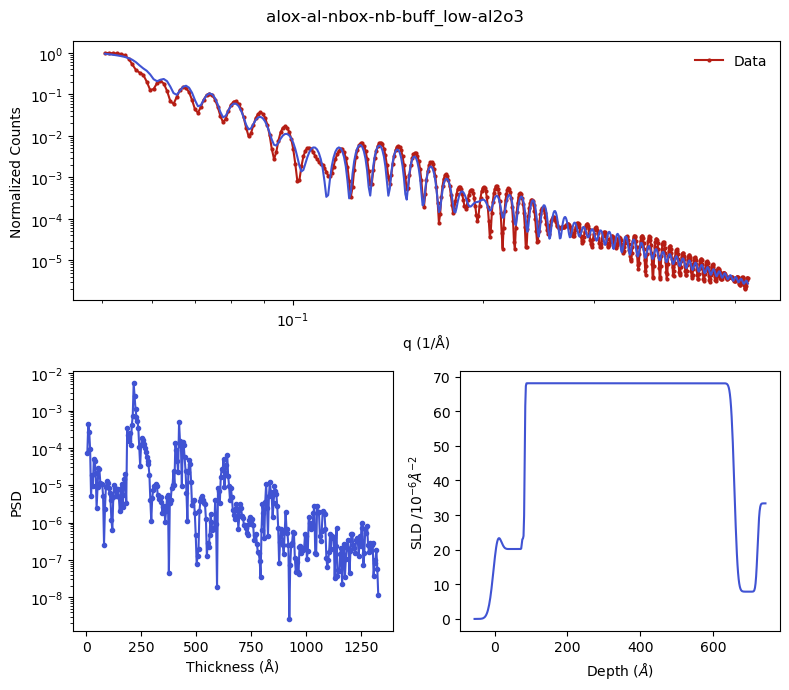

8.883183068043563: : 205it [01:13,  2.79it/s] 


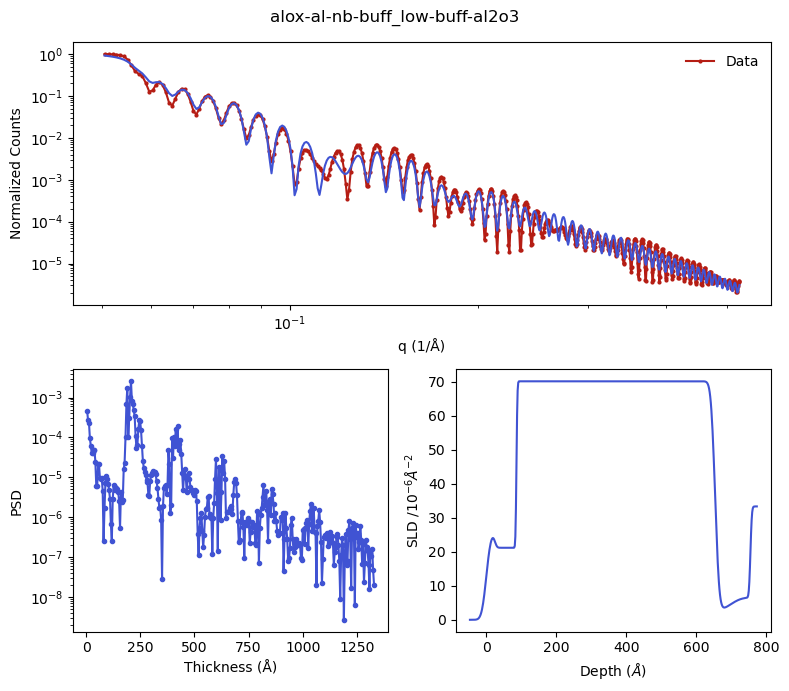

10.035180264795375: : 345it [02:31,  2.27it/s]


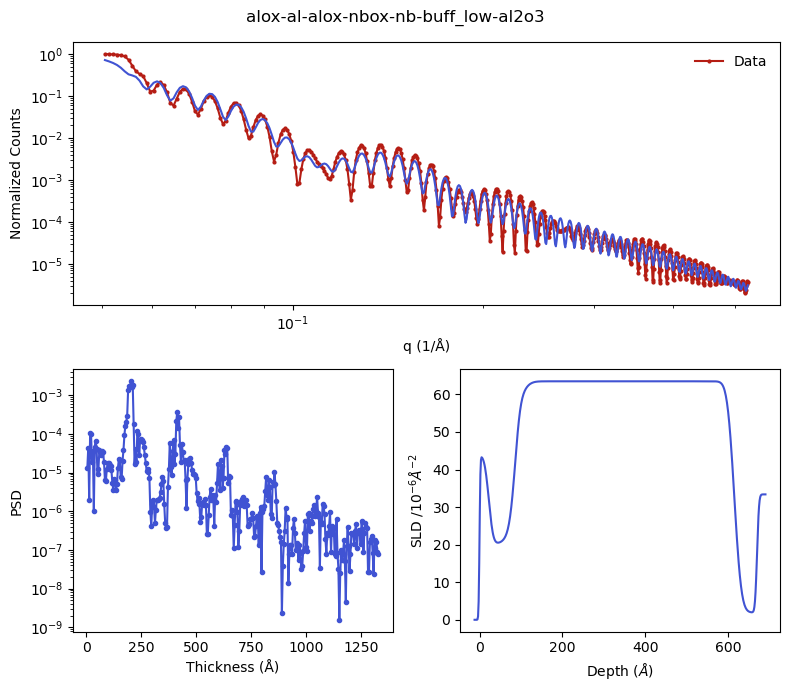

11.408535331040348: : 210it [01:15,  2.79it/s]


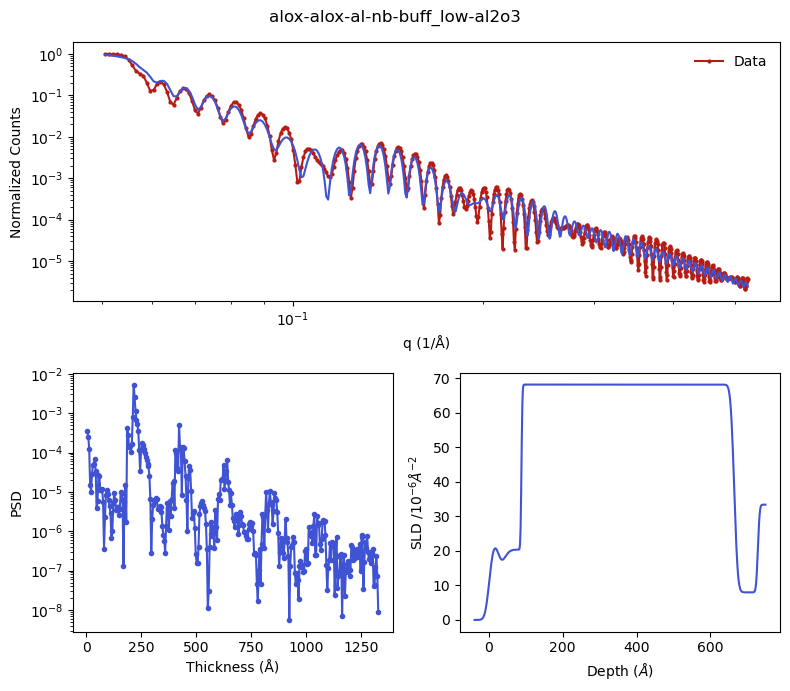

10.834712460705573: : 329it [02:39,  2.07it/s]


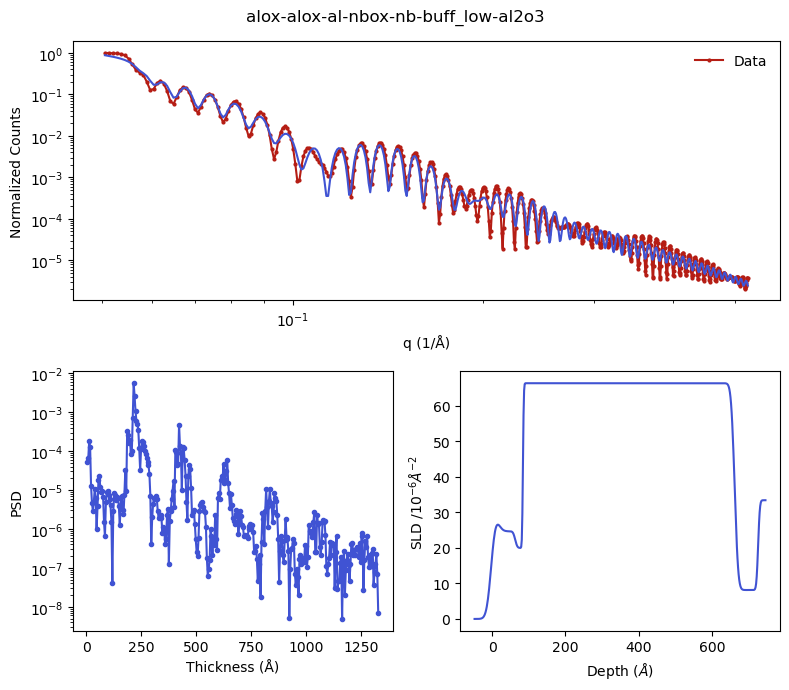

1.3367177892628388: : 601it [05:55,  1.69it/s]


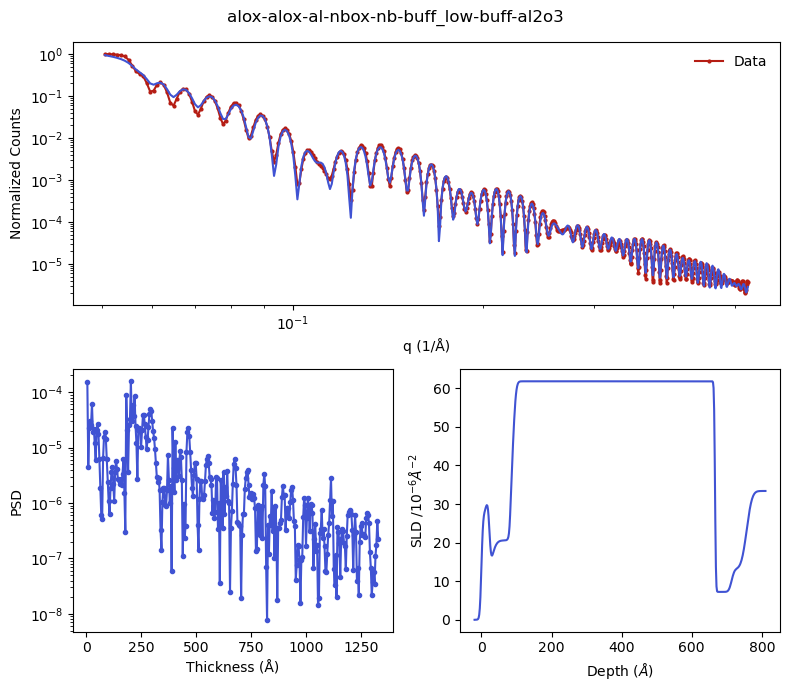

4.478441086226868: : 495it [05:41,  1.45it/s] 


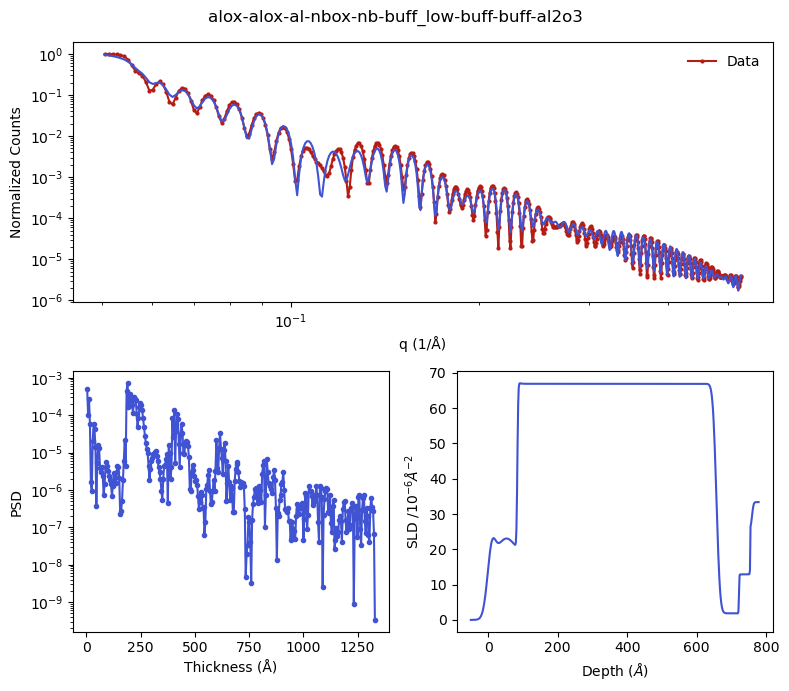

19.2868318442226: : 60it [00:16,  3.61it/s]  


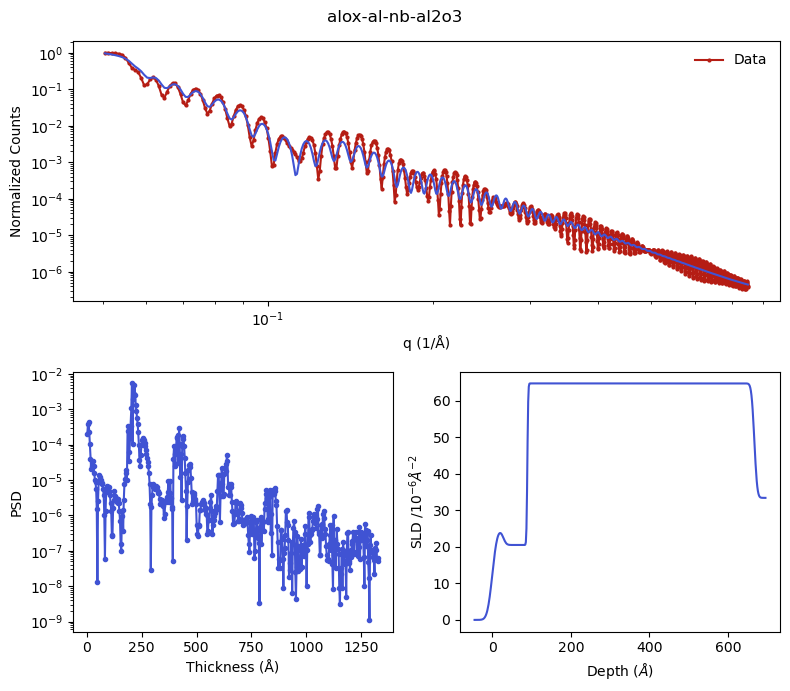

15.221808415309287: : 164it [00:54,  3.00it/s]


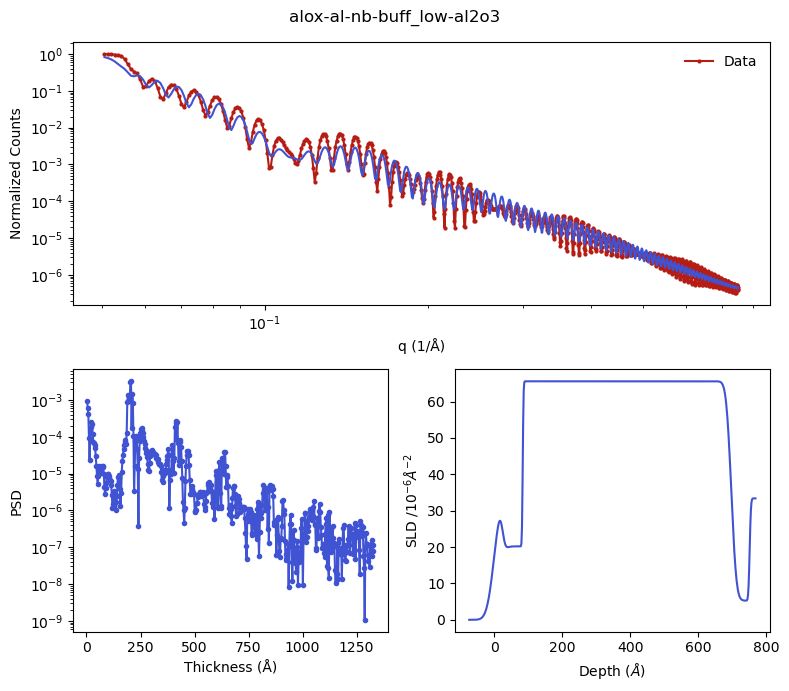

3.8869674132564773: : 356it [02:34,  2.31it/s]


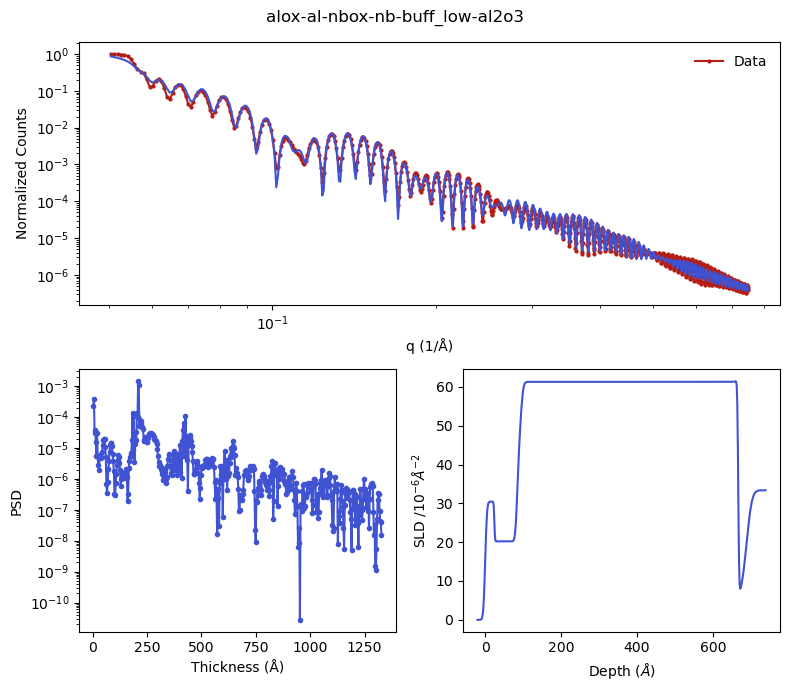

6.116988327094934: : 342it [02:26,  2.34it/s] 


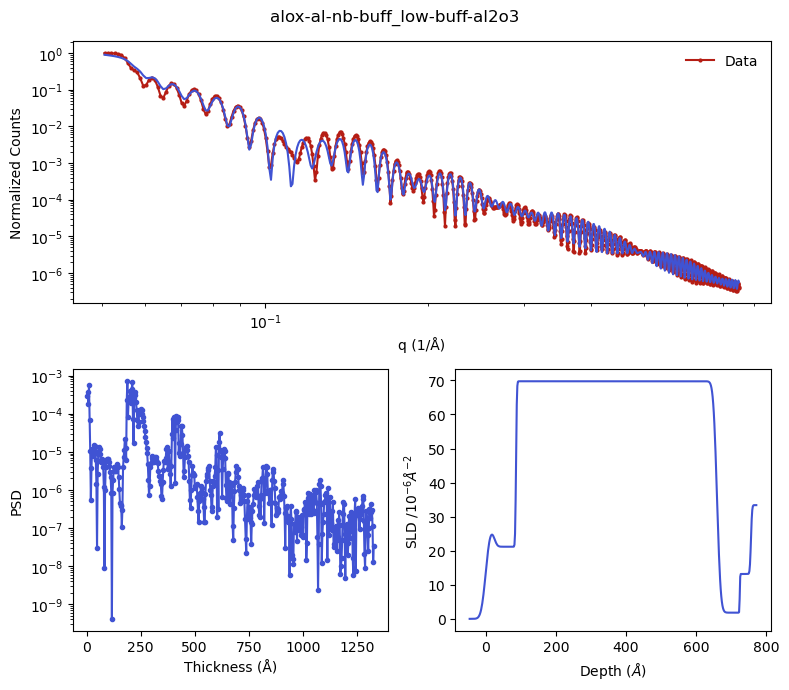

17.955705742231288: : 245it [02:15,  1.81it/s]


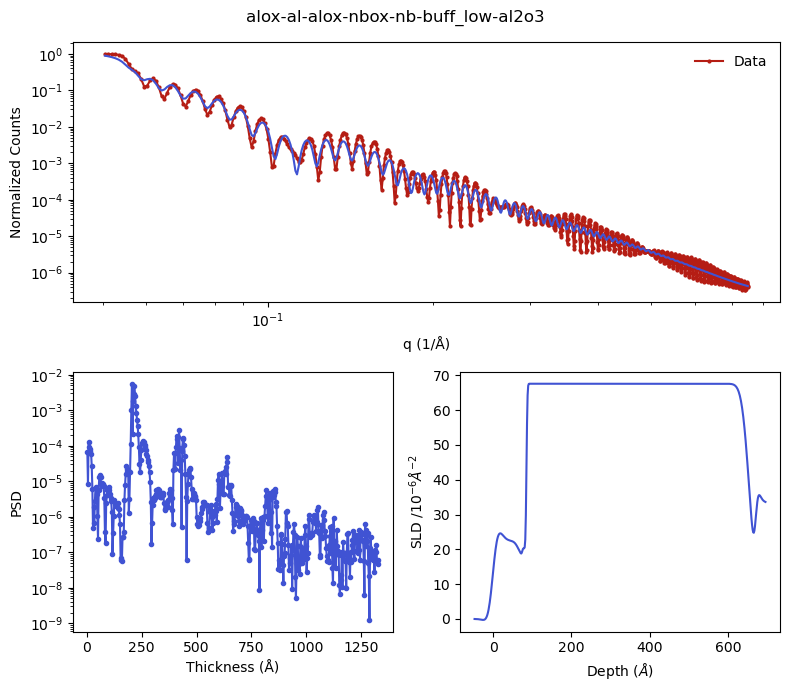

13.951051397565273: : 190it [01:31,  2.07it/s]


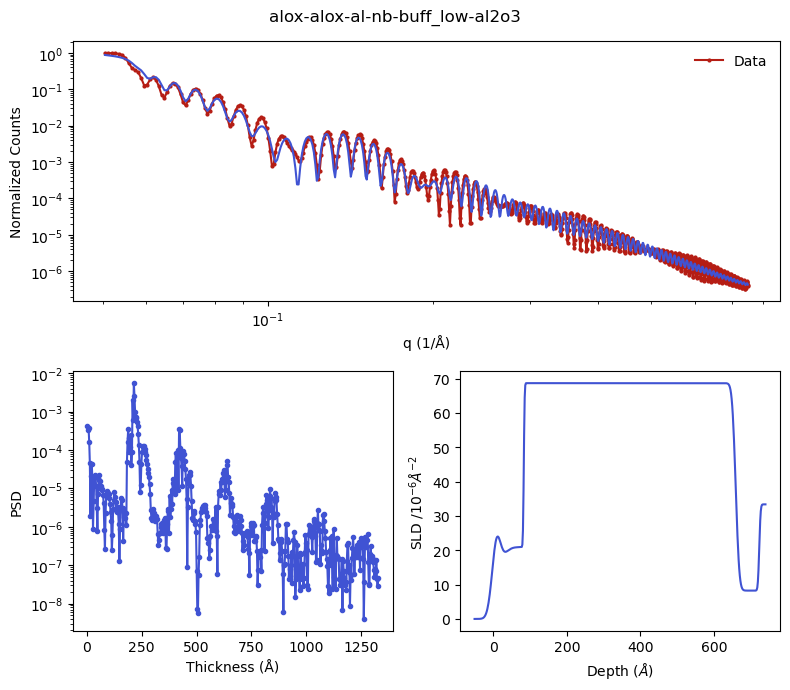

15.187067373132589: : 292it [03:02,  1.60it/s]


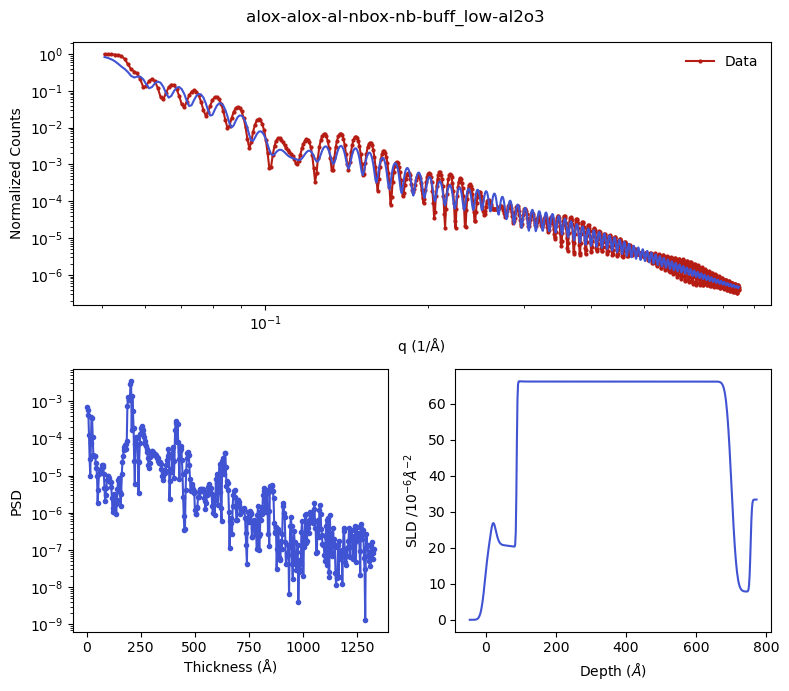

5.32900433744192: : 513it [06:30,  1.31it/s]  


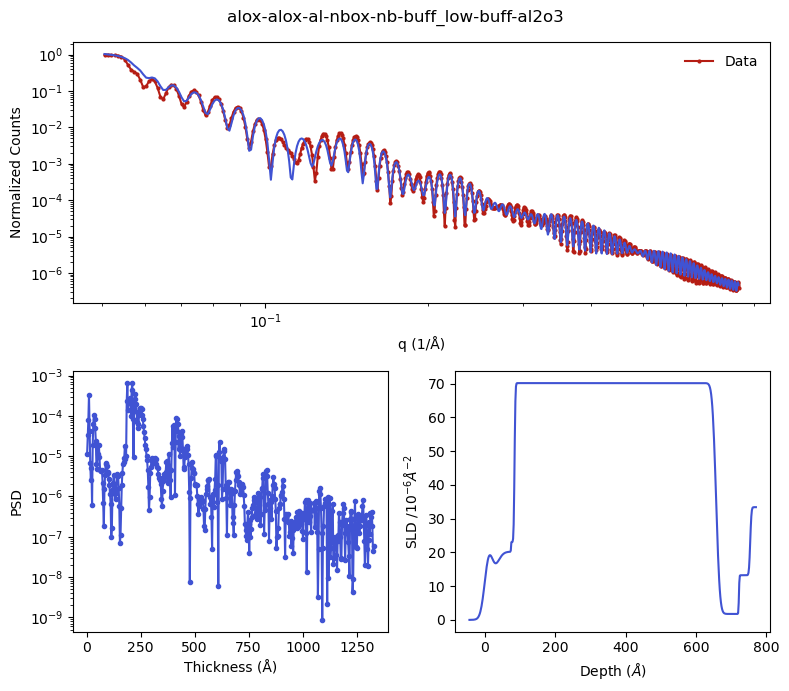

8.425900865294775: : 1000it [15:08,  1.10it/s]


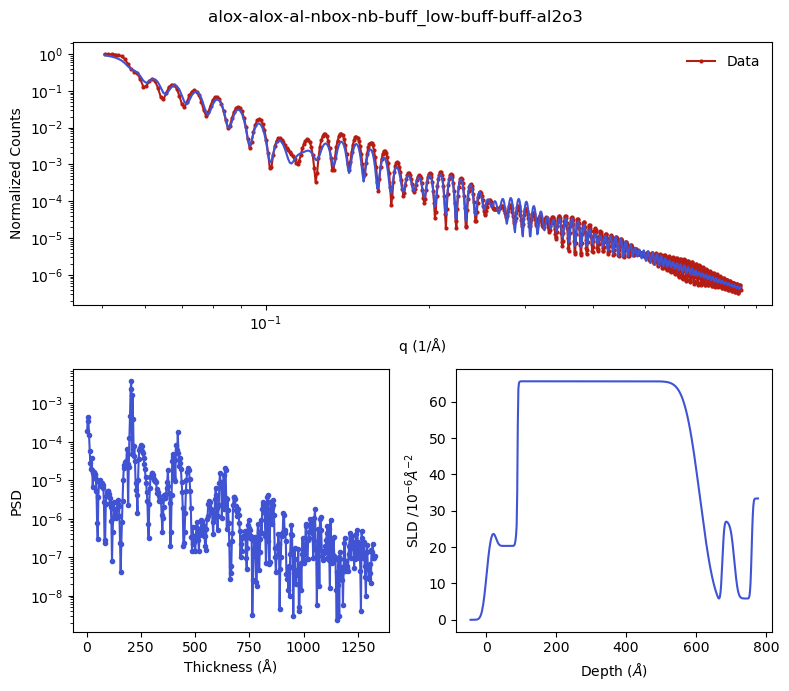

20.204854520567576: : 72it [00:26,  2.75it/s]


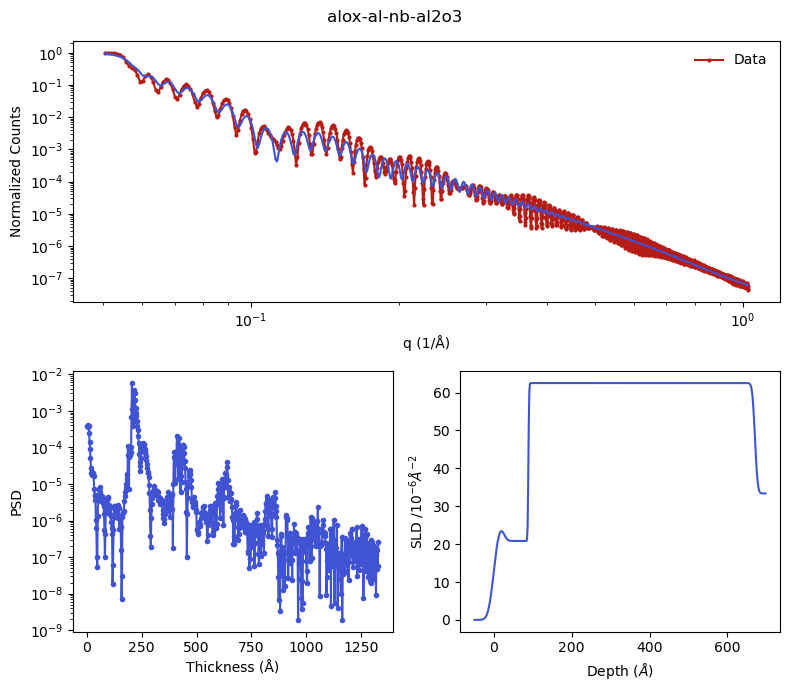

17.174657742900294: : 208it [01:40,  2.08it/s]


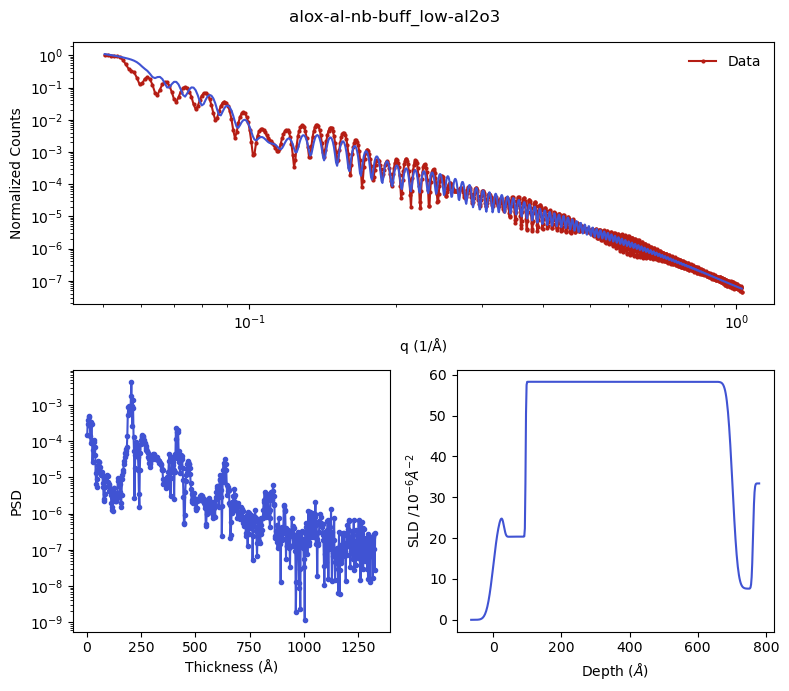

14.181168981673792: : 305it [03:13,  1.57it/s]


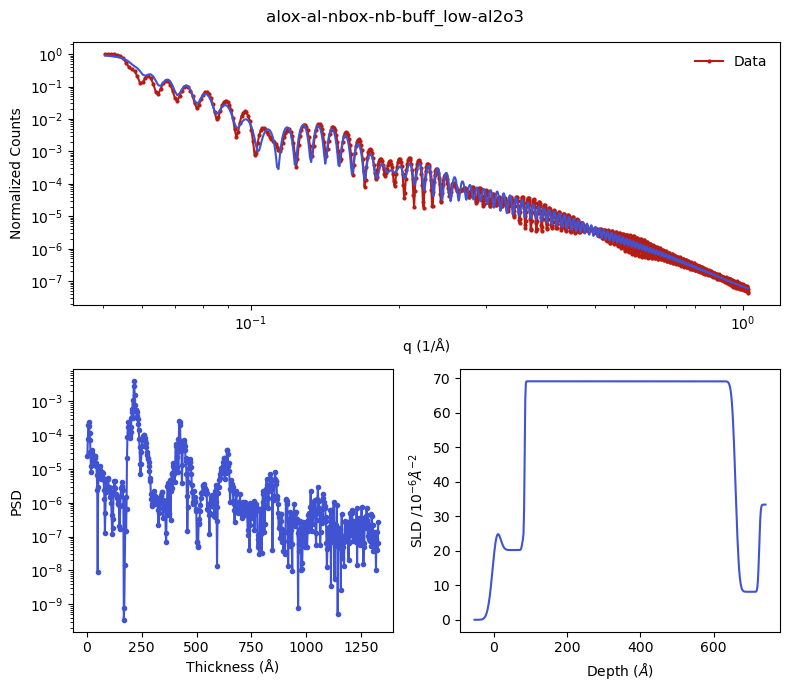

12.802996606028486: : 184it [02:08,  1.44it/s]


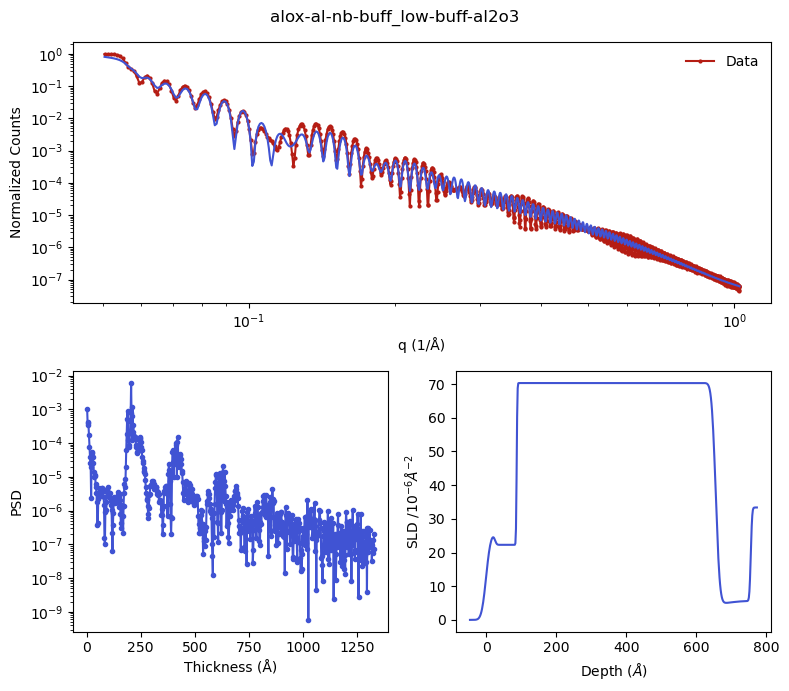

14.760449247893156: : 313it [04:03,  1.29it/s]


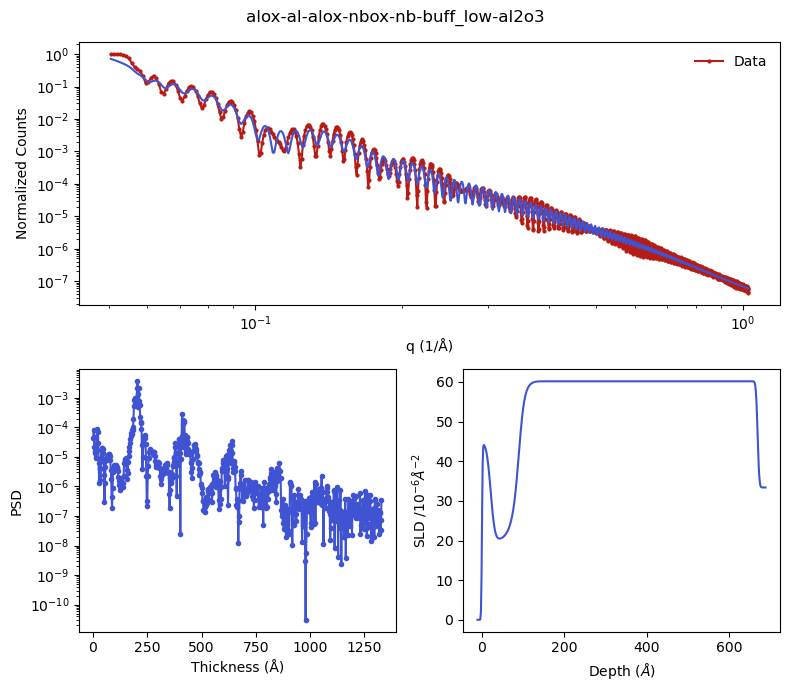

14.984462930501039: : 135it [01:18,  1.72it/s]


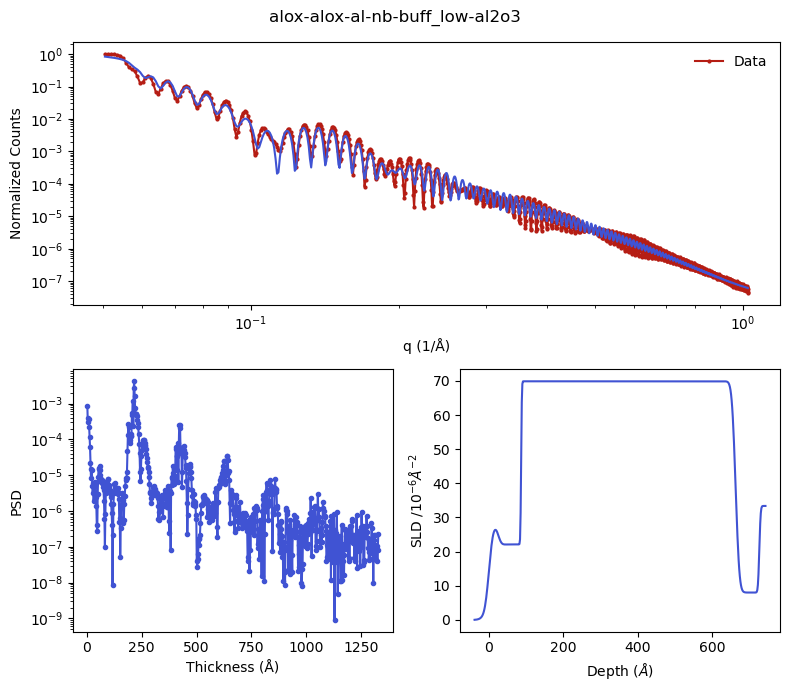

5.993537775611374: : 388it [05:11,  1.25it/s] 


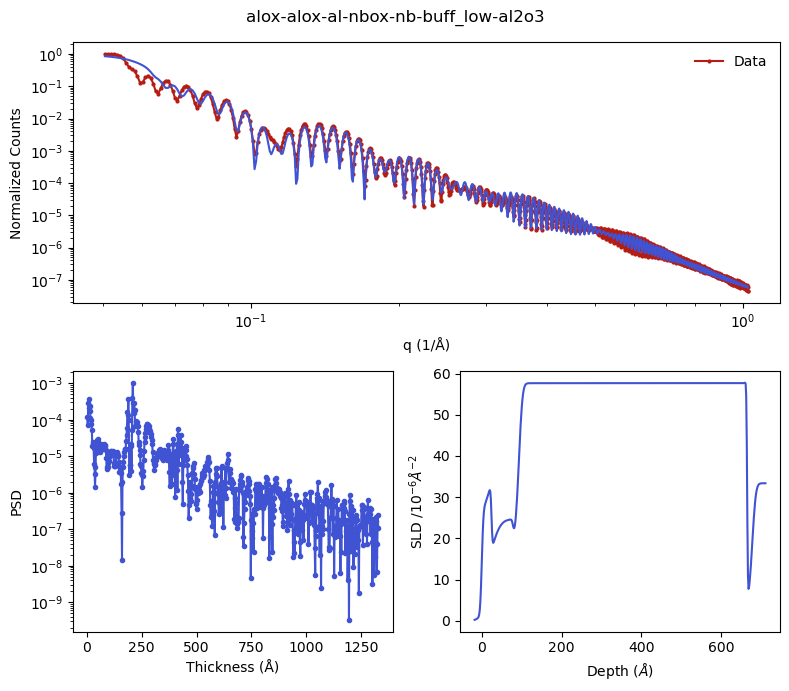

8.846617111149243: : 800it [13:08,  1.01it/s] 


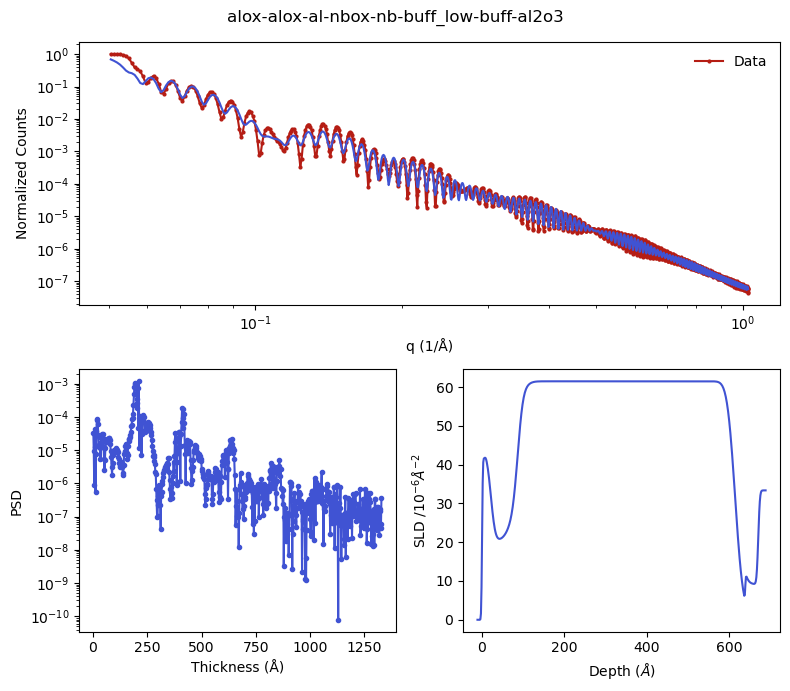

4.744500145967512: : 1000it [19:15,  1.16s/it]


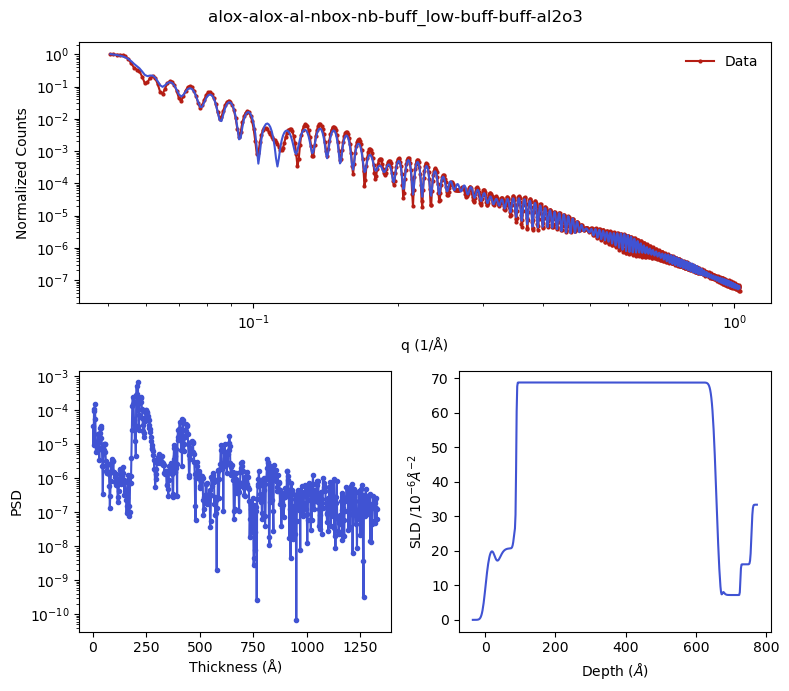

In [19]:
# out_lists has length layers, and is a list with different qrngs
%matplotlib inline
par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':23}
qrng = [0.05, 0.15]
           
           
           #0  top    1  top/bot          2  top/mid/bot                4 top/bot/bot
# layers = ['alox/al/nb','alox/al/nb/buff_low','alox/al/nbox/nb/buff_low','alox/al/nb/buff_low/buff',
#            #5  top/mid/mid/bot                               
#           'alox/al/alox/nbox/nb/buff_low',
#           # 6 top/top/bot        8 top/top/mid/bot            9 top/top/mid/bot/bot              top/top/mid/mid/bot/bot
#           'buff/alox/al/nb/buff_low', 'buff/alox/al/nbox/nb/buff_low','buff/alox/al/nbox/nb/buff_low/buff', 'buff/buff/alox/al/nbox/nb/buff_low/buff']

layers = ['alox/al/nbox/nb/buff_low','alox/al/nb/buff_low/buff',
#           5  top/mid/mid/bot                               
#layers=['alox/al/nbox/nb/buff_low']
#          6 top/top/bot        8 top/top/mid/bot            9 top/top/mid/bot/bot              top/top/mid/mid/bot/bot
          'buff/alox/al/nb/buff_low', 'buff/alox/al/nbox/nb/buff_low','buff/alox/al/nbox/nb/buff_low/buff', 'buff/buff/alox/al/nbox/nb/buff_low/buff']

layers = ['alox/al/nb','alox/al/nb/buff_low','alox/al/nbox/nb/buff_low','alox/al/nb/buff_low/buff',
#            #5  top/mid/mid/bot                               
           'alox/al/alox/nbox/nb/buff_low',
#           # 6 top/top/bot        8 top/top/mid/bot            9 top/top/mid/bot/bot              top/top/mid/mid/bot/bot
           'alox/alox/al/nb/buff_low', 'alox/alox/al/nbox/nb/buff_low','alox/alox/al/nbox/nb/buff_low/buff', 'alox/alox/al/nbox/nb/buff_low/buff/buff']

# layers = ['alox/al/nb','alox/al/nb/buff','alox/al/alox/nb/buff','alox/al/nb/alox/buff','alox/al/nb/buff/alox',
#           # 5 top/mid/bot/bot       6  top/mid/mid/bot                               
#           'alox/al/alox/nb/alox/buff','alox/al/buff/alox/nb/buff',
#           # 7 top/top/bot        8 top/top/mid/bot            9 top/top/mid/bot/bot              top/top/mid/mid/bot/bot
#           'alox/alox/al/nb/buff', 'alox/alox/al/alox/nb/buff','alox/alox/al/alox/nb/buff/alox', 'alox/alox/al/alox/alox/nb/buff/alox']


for i in range(len(layers)): 
    layers[i]=layers[i]+ '/al2o3'

out_lists = [[] for _ in range(len(layers))]
SLD_rng = [0.65, 0.1]
data_file = flist[15]

for i in range(6): 
    qrng[1]=0.15 + 0.05*i+0.025*i**2
    for j in range(len(layers)):
        par = {'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'x_err':1.9}
        par['thk']=[60, 570]
        out_lists[j].append(ana_xrr.sim(pth + data_file, layers[j], par, qrng, SLD_rng=SLD_rng))

full_obj = ana_xrr.collect_obj(out_lists)
full_pars = ana_xrr.collect_pars(out_lists)

6.297816759262312: : 982it [1:07:22,  4.12s/it] 
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:483: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


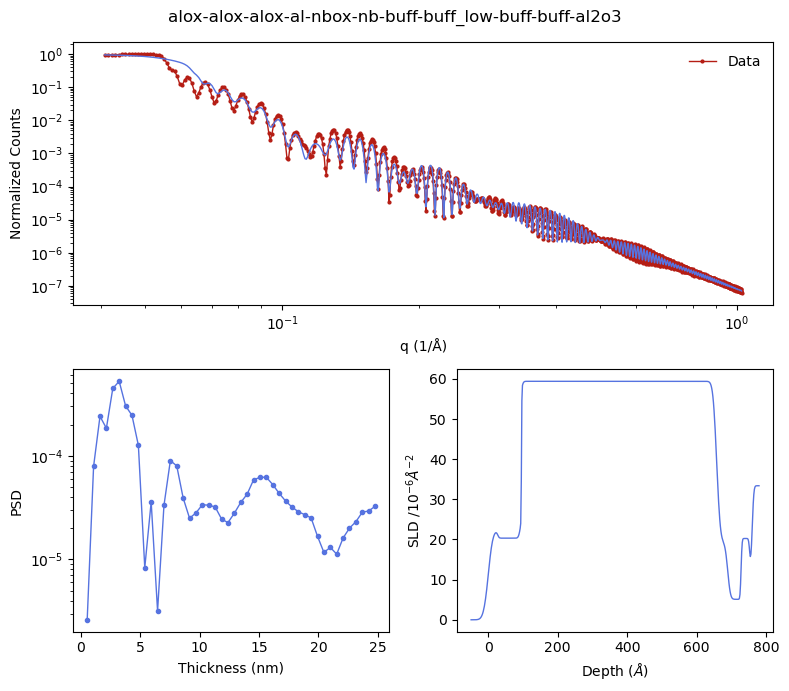

In [314]:
# out_lists has length layers, and is a list with different qrngs
%matplotlib inline
par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':23}
qrng = [0.04, 0.15]
        
#layers = ['alox/al/nb','alox/al/nb/buff_low','alox/al/nb/buff_med','alox/al/nb/buff','alox/al/nb/alox']#,'alox/al/nbox/nb/buff_low','alox/al/nbox/nb/buff_med',
#layers = ['alox/al/nb/buff_low','alox/al/nbox/nb/buff_low','alox/al/alox/nb/buff_low','alox/al/buff/nb/buff_low']
#layers = ['alox/alox/al/nbox/nb/buff_low', 'buff/alox/al/nbox/nb/buff_low','alox/buff/al/nbox/nb/buff_low']
layers = ['alox/alox/alox/al/nbox/nb/buff/buff_low/buff/buff']

for i in range(len(layers)): 
    layers[i]=layers[i]+ '/al2o3'

out_lists = [[] for _ in range(len(layers))]
SLD_rng = [0.45, 0.1]
data_file = flist[16]

for i in range(5,6): 
    qrng[1]=0.15 + 0.05*i+0.025*i**2
    for j in range(len(layers)):
        par = {'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'x_err':1.9}
        par['thk']=[60, 570]
        out_lists[j].append(ana_xrr.sim(pth + data_file, layers[j], par, qrng, SLD_rng=SLD_rng, img_path=img_pth))

full_obj = ana_xrr.collect_obj(out_lists)
full_pars = ana_xrr.collect_pars(out_lists)

2.735759096793279: : 2000it [10:35:00, 19.05s/it] 
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:483: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


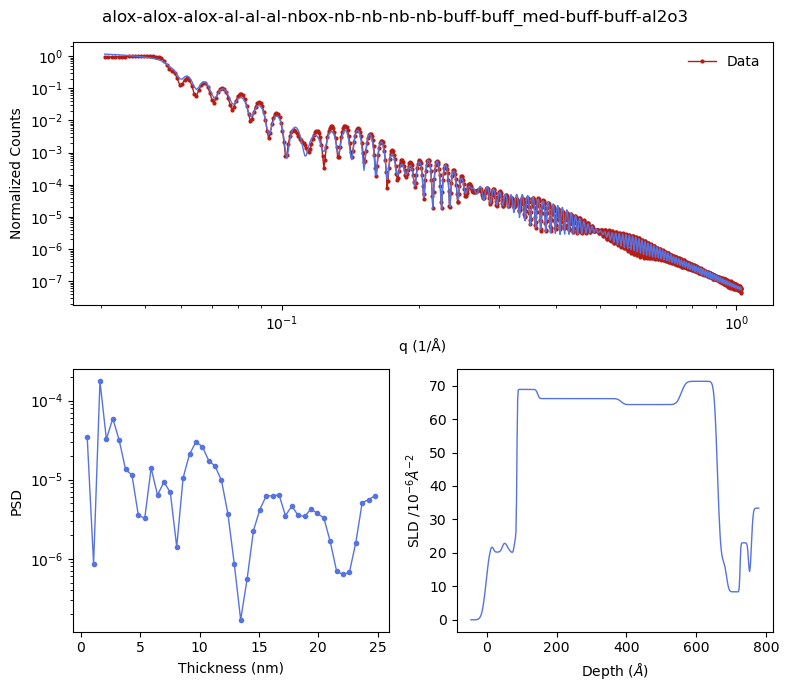

In [306]:
# out_lists has length layers, and is a list with different qrngs
%matplotlib inline
par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':23}
qrng = [0.04, 0.15]
        
layers = ['alox/alox/alox/al/nbox/nb/nb/nb/nb/buff/buff_med/buff/buff']

for i in range(len(layers)): 
    layers[i]=layers[i]+ '/al2o3'

out_lists = [[] for _ in range(len(layers))]
SLD_rng = [0.5, 0.15]
data_file = flist[15]

for i in range(5,6): 
    qrng[1]=0.15 + 0.05*i+0.025*i**2
    for j in range(len(layers)):
        par = {'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'x_err':1.9}
        if j==0:
            par['thk']=[55, 63, 235, 170,105]
        if j==1:
            par['thk']=[60, 100, 250, 220]
        if j==2:
            par['thk']=[60, 100, 200, 170,100]
        out_lists[j].append(ana_xrr.sim(pth + data_file, layers[j], par, qrng, SLD_rng=SLD_rng, img_path=img_pth))

full_obj = ana_xrr.collect_obj(out_lists)
full_pars = ana_xrr.collect_pars(out_lists)

### Run single

3.463077826061032: : 390it [05:07,  1.27it/s] 


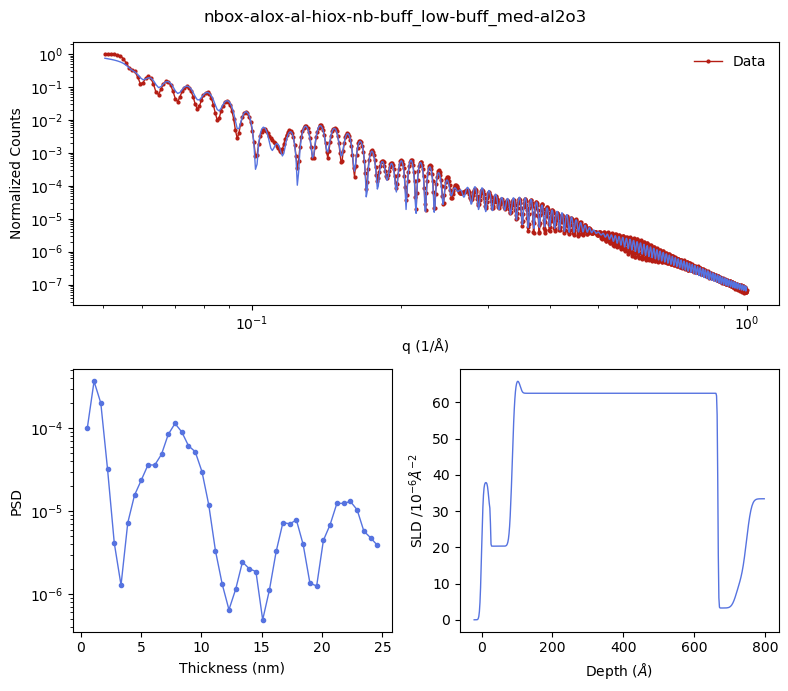

In [203]:
# out_lists has length layers, and is a list with different qrngs
%matplotlib inline
par={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':23}
qrng = [0.05, 1]
        
#layers = ['alox/al/nb','alox/al/nb/buff_low','alox/al/nb/buff_med','alox/al/nb/buff','alox/al/nb/alox']#,'alox/al/nbox/nb/buff_low','alox/al/nbox/nb/buff_med',
#layers = ['alox/al/nb/buff_low','alox/al/nbox/nb/buff_low','alox/al/alox/nb/buff_low','alox/al/buff/nb/buff_low']
#layers = ['alox/alox/al/nbox/nb/buff_low', 'buff/alox/al/nbox/nb/buff_low','alox/buff/al/nbox/nb/buff_low']
layers = ['nbox/alox/al/hiox/nb/buff_low/buff_med']

for i in range(len(layers)): 
    layers[i]=layers[i]+ '/al2o3'

out_lists = [[] for _ in range(len(layers))]
#SLD_rng = [0.4, 0.075]
SLD_rng = [0.35, 0.1]
data_file = flist[15]
j=0
par = {'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'x_err':1.9}
par['thk']=[60, 570]
obj, par = ana_xrr.sim(pth + data_file, layers[j], par, qrng, SLD_rng=SLD_rng, img_path=img_pth)



### Plot different ranges

In [255]:
# This chooses one layer and plots all the different leghts 
print(len(full_obj))
layer_ind = 2
ana_xrr.plot_obj_pane(full_obj[layer_ind], ['Data']*len(full_obj[layer_ind]), ind=len(full_obj[layer_ind])-1, path=img_pth, fname=layers[layer_ind].replace('/', '-')+'_'+data_file[0:-4])

ana_xrr.compare_pars(full_pars[layer_ind], img_path=img_pth, fname=layers[layer_ind].replace('/', '-')+'_'+data_file[0:-4])

6


IndexError: list index out of range

### Plot different layer sets

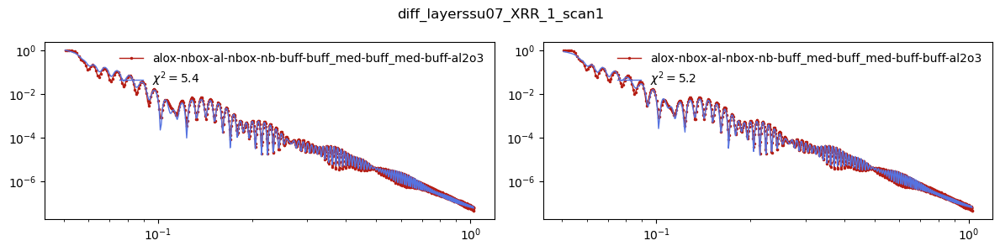

In [236]:
layer_list = [layer.replace('/', '-') for layer in layers]
plot_ind = 0 
q_ind = 5
# outer is layers, inner is q range  
ana_xrr.plot_obj_pane(grab_ind(full_obj,q_ind), layer_list, ind=plot_ind, path=img_pth, fname='diff_layers'+data_file[0:-4])

### Print tables

In [60]:
layer_ind = 7
q_ind = 3
ana_xrr.generate_table(out_lists[layer_ind][q_ind][1])

layer_ind = 8
q_ind = 5
ana_xrr.generate_table(out_lists[layer_ind][q_ind][1])
#print(out_lists[2][0][0])

Layer Properties:
     Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
    alox_0      22.807341       3.629349          25.751312
    alox_1       0.009371      12.978003          41.994525
      al_2      60.205340       3.962752          20.575229
    nbox_3       7.162559       2.773453          29.466231
      nb_4     576.124280       6.712395          61.788614
buff_low_5      47.472125       2.190384           7.234550
    buff_6      42.852307       6.461947          13.139815
   al2o3_7            inf      12.152791          33.380000

Additional Parameters:
       Parameter     Value
           Chisq  2.670270
Log10 Background -6.301030
 DQ - Resolution  0.500000
        Q Offset -0.000004
           Scale  1.497161
Layer Properties:
     Layer  Thickness (Å)  Roughness (Å)  SLD (10^-6 cm^-2)
    alox_0      26.581969       7.554149          16.269011
    alox_1       0.126186      14.655082          37.123796
      al_2      55.200943       7.758319          20.73337

Would be nice to ploit them for extended segment 


### Compare x err

9.325639334831836: : 508it [10:05,  1.19s/it] 
/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:483: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


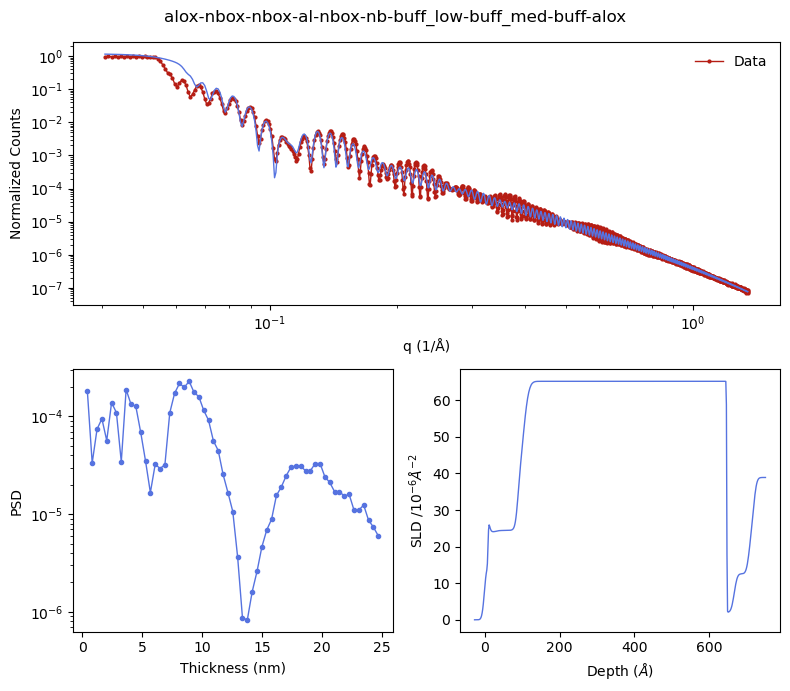

2.010029867097721: : 1133it [24:36,  1.30s/it] 


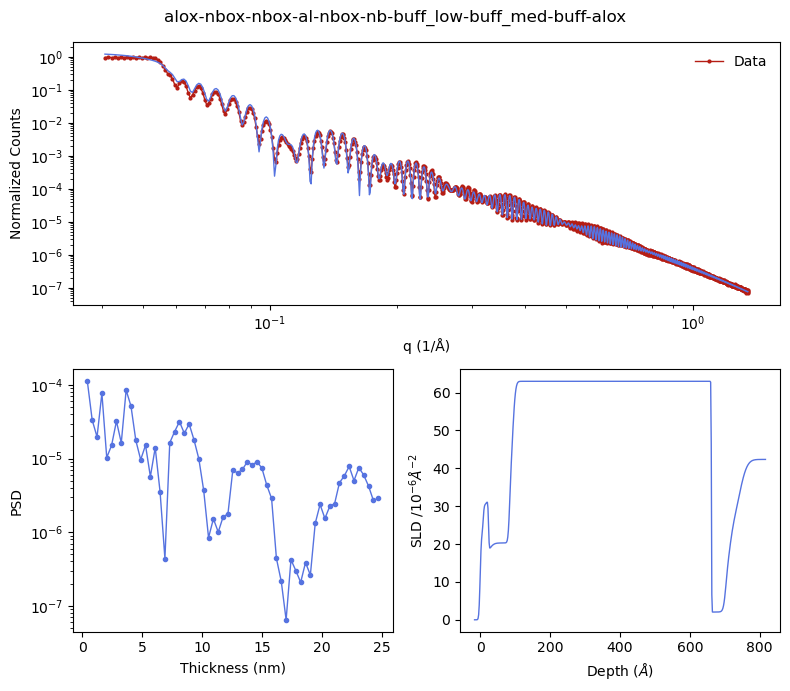

2.066242516725129: : 1220it [25:42,  1.26s/it] 


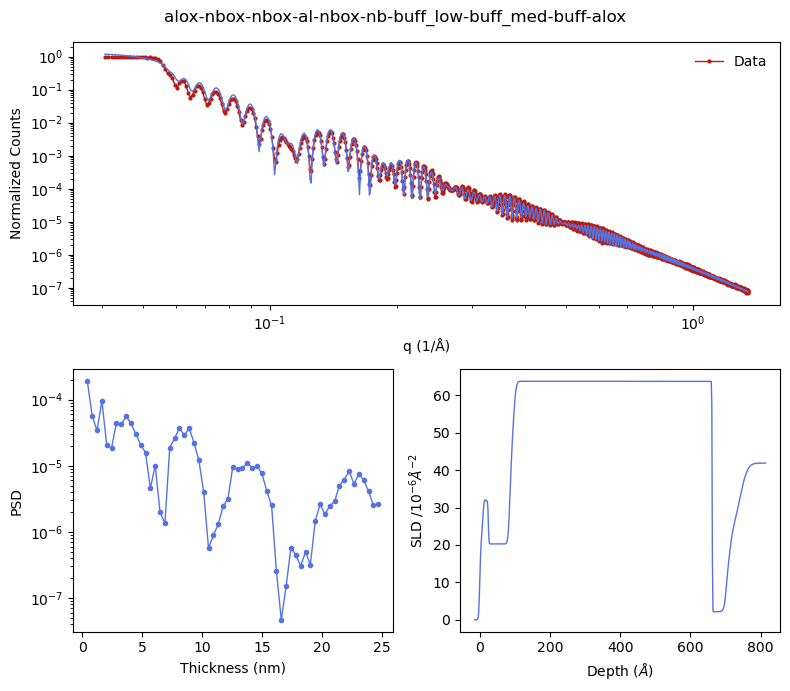

2.095639911882457: : 983it [20:26,  1.25s/it] 


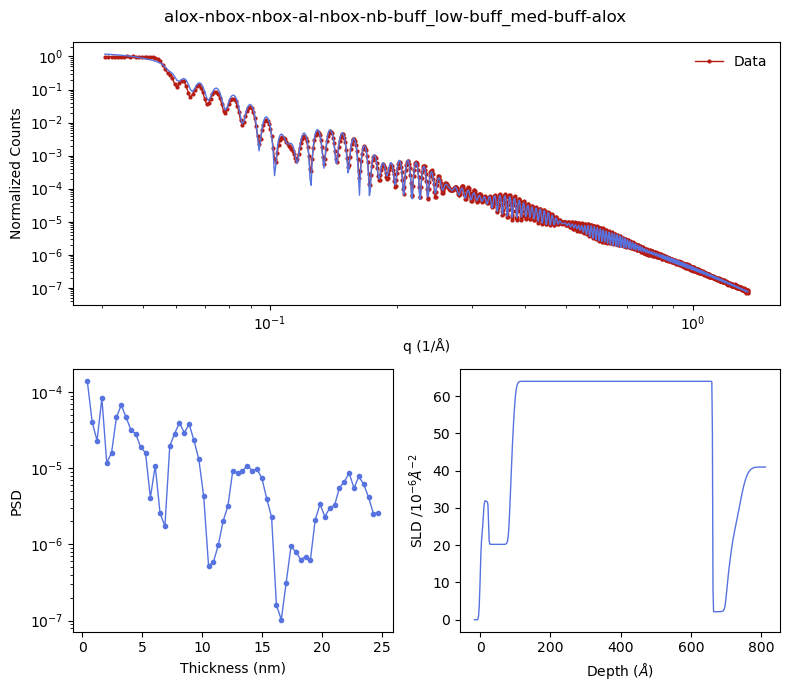

2.097629734294685: : 721it [14:02,  1.17s/it] 


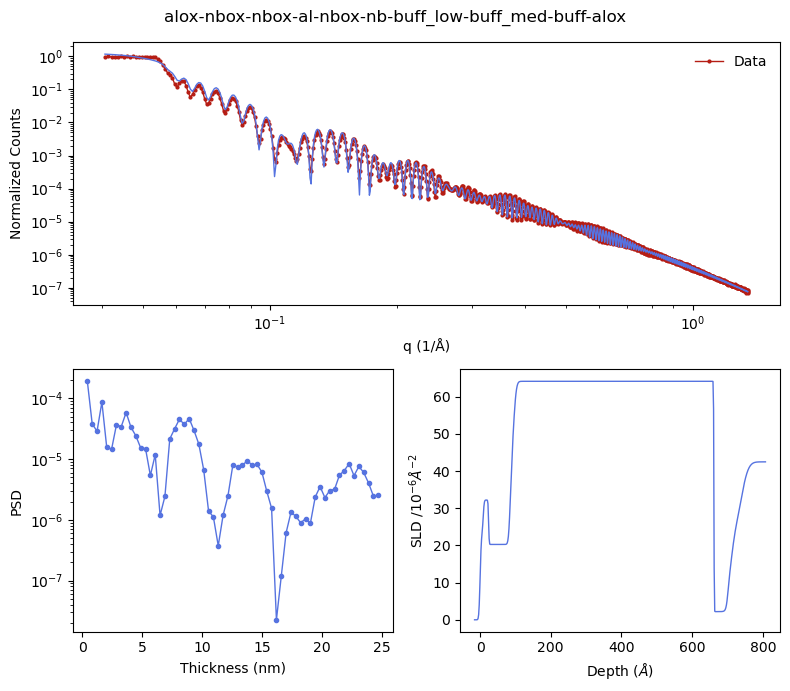

1.8604833595025527: : 1136it [21:20,  1.13s/it]


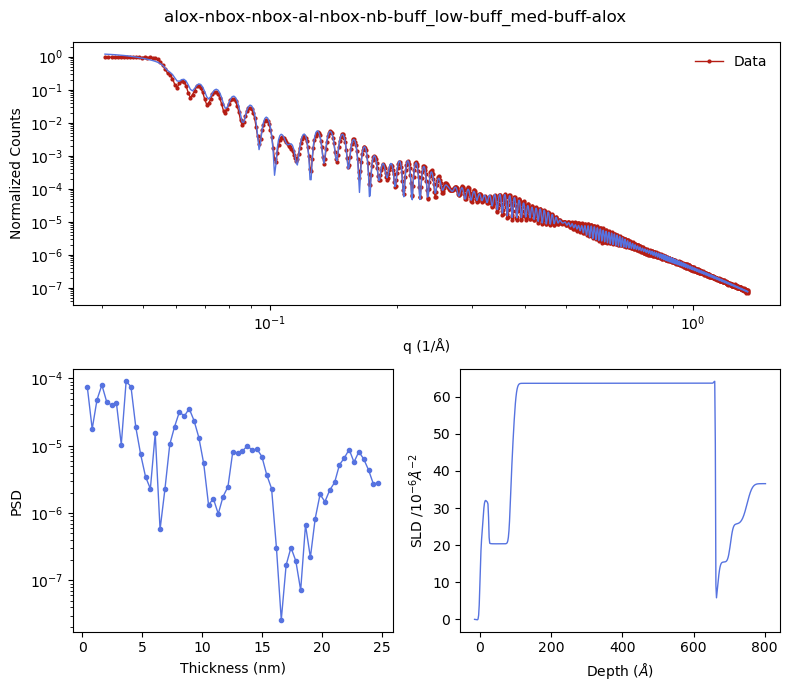

In [294]:
%matplotlib inline
qrng = [0.04, 0.15]

SLD_rng = [0.55, 0.1]
x_err = np.linspace(1.5,2.5, 6)
layer = 'alox/nbox/nbox/al/nbox/nb/buff_low/buff_med/buff/alox'
out_lists = [[] for _ in range(len(x_err))]

for i in range(6,5,-1): 
    qrng[1]=0.15 + 0.05*i+0.025*i**2
    for j in range(len(x_err)):
        par = {'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20,'x_err':x_err[j]}
        par['thk']=[60, 570]
        out_lists[j].append(ana_xrr.sim(pth + flist[13], layer, par, qrng, SLD_rng=SLD_rng))

full_obj = ana_xrr.collect_obj(out_lists)
full_pars = ana_xrr.collect_pars(out_lists)

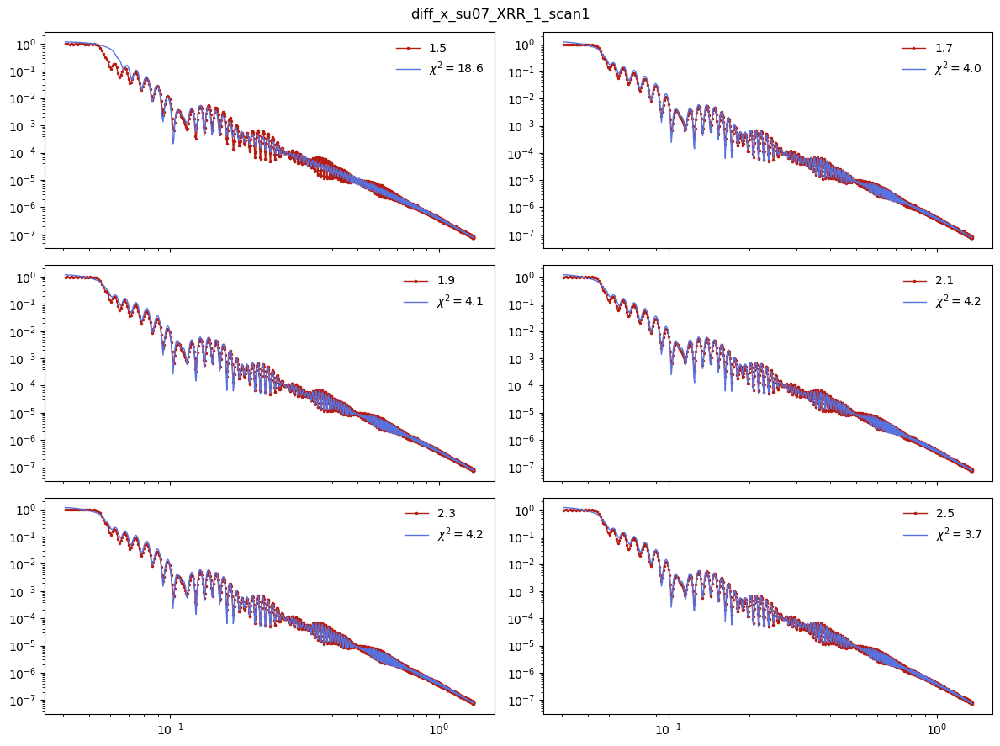

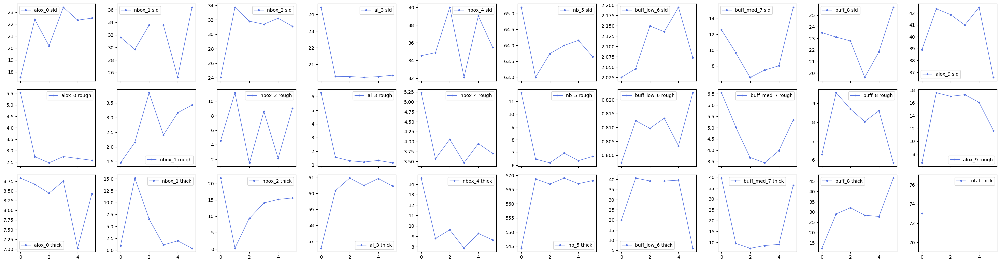

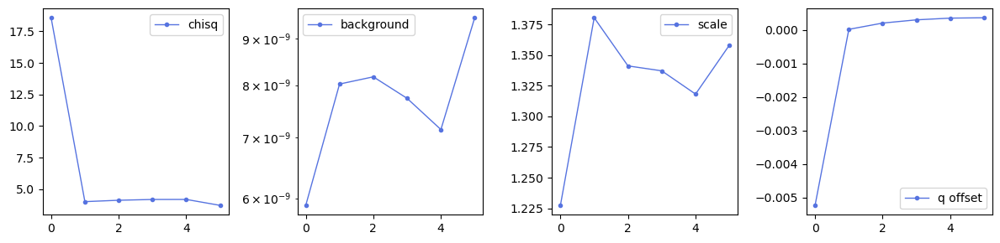

In [295]:

plot_ind = 0 
q_ind = 0
# outer is layers, inner is q range  
ana_xrr.plot_obj_pane(grab_ind(full_obj,q_ind), x_err, ind=plot_ind, path=img_pth, fname='diff_x_'+data_file[0:-4])
ana_xrr.compare_pars(grab_ind(full_pars,q_ind), img_path=img_pth, fname=layers[0].replace('/', '-')+'_'+data_file[0:-4])

[{'thk': array([  1.32636685,   6.78808034,  14.86251175,  60.07855734,
           7.88877379, 569.50825268,   5.85570157,  27.30322168,
           8.58769363,   5.05939674]),
  'rough': array([3.08973392, 2.52367277, 2.09516263, 1.14209779, 3.16211006,
         7.16245155, 0.81448034, 4.83851937, 3.13379848, 6.62855201]),
  'sld': array([37.50755139, 23.81420038, 30.49461507, 20.18850008, 29.73046849,
         63.52325179,  4.54990197, 14.49852215, 13.44631809, 25.50611114]),
  'layers': array(['alox_0', 'nbox_1', 'nbox_2', 'al_3', 'nbox_4', 'nb_5',
         'buff_med_6', 'buff_med_7', 'buff_8', 'buff_9'], dtype='<U10'),
  'scale': 1.4672780405532544,
  'bkg': 8.708603290582692e-09,
  'dq - resolution': 0.5,
  'q_offset': 0.00027304871522529833,
  'chisq': 4.219030411945503,
  'sub_rough_max': 20},
 {'thk': array([ 26.48041709,  23.70288557,  23.73437568,  59.64247924,
           7.07300362, 570.94397062,  26.88309181,  23.91724168,
          44.63304889,   1.85291767]),
  'rough': ar

In [ ]:

print(len(full_obj))
layer_ind = 2
ana_xrr.plot_obj_pane(full_obj[layer_ind], ['Data']*len(full_obj[layer_ind]), ind=len(full_obj[layer_ind])-1, path=img_pth, fname=layers[layer_ind].replace('/', '-')+'_'+data_file[0:-4])

ana_xrr.compare_pars(full_pars[layer_ind], img_path=img_pth, fname=layers[layer_ind].replace('/', '-')+'_'+data_file[0:-4])

In [ ]:
print(len(full_obj))
layer_ind = 2
ana_xrr.plot_obj_pane(full_obj[layer_ind], ['Data']*len(full_obj[layer_ind]), ind=len(full_obj[layer_ind])-1, path=img_pth, fname=layers[layer_ind].replace('/', '-')+'_'+data_file[0:-4])

ana_xrr.compare_pars(full_pars[layer_ind], img_path=img_pth, fname=layers[layer_ind].replace('/', '-')+'_'+data_file[0:-4])

In [281]:
full_obj = ana_xrr.collect_obj(out_lists)
full_pars = ana_xrr.collect_pars(out_lists)


In [20]:
full_obj = ana_xrr.collect_obj(out_lists)
def grab_ind(obj_list, ind): 
    return [o[ind] for o in obj_list]
sns.set_palette('coolwarm', 10)
plt.rcParams['lines.linewidth'] = 1
xlist = x_err 
# ind refers to what data is shown 
# first number is which data set 
ana_xrr.plot_obj_pane(grab_ind(full_obj,5), xlist, ind=0, path=img_pth, fname='test')

NameError: name 'x_err' is not defined

### Check chi square

Text(0.5, 0, 'Q range')

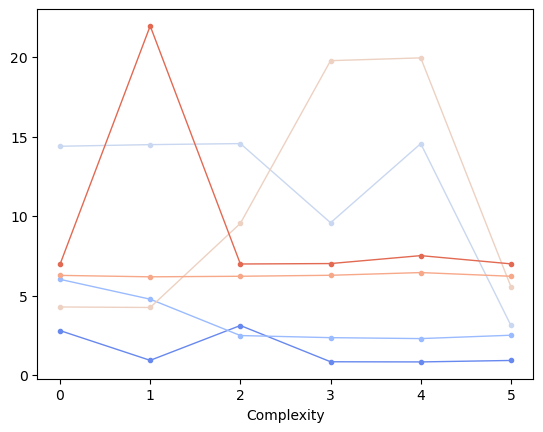

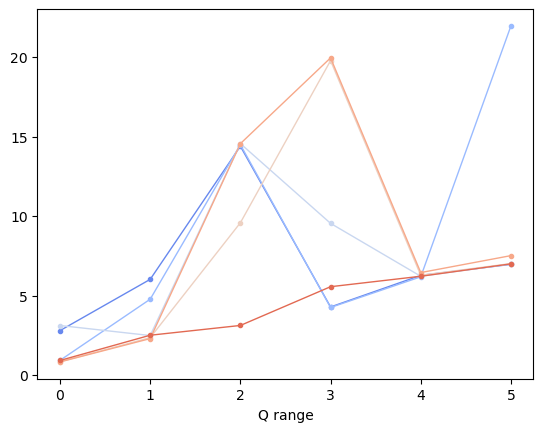

In [28]:
c = []; dq = []
for j in range(len(out_lists[0])):
    c.append([o[j][1]['chisq'].tolist() for o in out_lists[0:]])
    dq.append([o[j][1]['dq - resolution'] for o in out_lists[1:]])

sns.set_palette('coolwarm',6)
plotval = np.array(c)
plt.figure()
plt.plot(plotval.T,'.-')
plt.xlabel('Complexity')
sns.set_palette('coolwarm',6)
plt.figure()
plt.plot(plotval,'.-')
plt.xlabel('Q range')

0.08296912497649979: : 1000it [03:53,  4.29it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       10.537592        0.974386          30.164540
   al_1       66.579193        0.767190          22.246699
 buff_2        5.986457        0.049618           4.547989
   nb_3      571.495964        7.866434          64.572737
 buff_4       14.292040        0.667140           7.127393
 alox_5       38.311807        7.518633          20.581301
al2o3_6             inf       11.340046          33.319000

Additional Parameters:
       Parameter               Value
           Chisq 0.16525539550481624
Log10 Background            -6.30103
 DQ - Resolution            1.563117
        Q Offset            0.001209
           Scale            1.453363


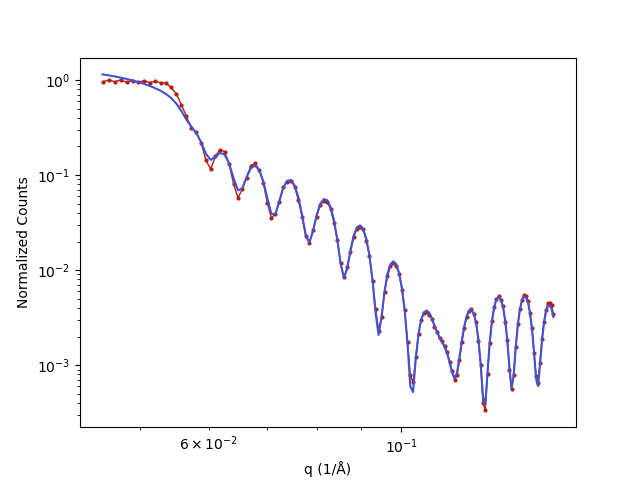

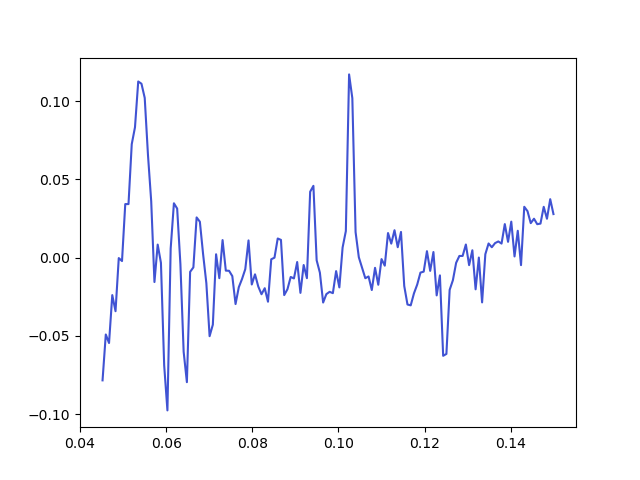

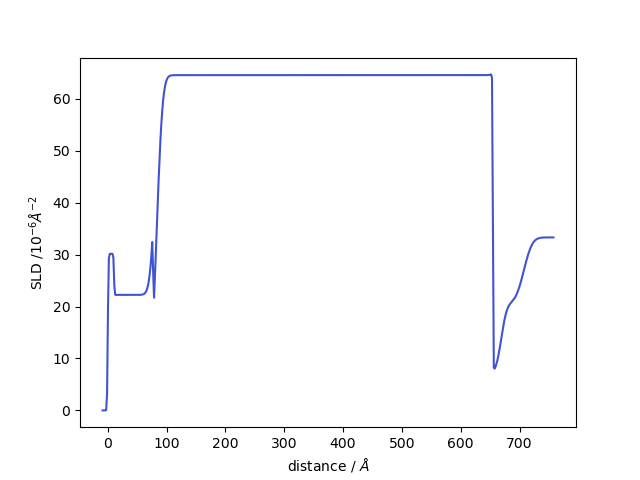

In [246]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6, 576, 1,5, np.inf], 
     'rough':[3.7,1.6,5,7.3,1,1,3], 
     'sld':[28, 20, 11, 65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)